In [1]:
%config InlineBackend.figure_format = 'retina'

In [2]:
# import packages
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import obspy

import rasterio
from pathlib import Path
import geopandas as gpd
from pyproj import Proj
from netCDF4 import Dataset

from obspy.clients.fdsn import Client
from mpl_toolkits.basemap import Basemap
from matplotlib.colors import LogNorm

from datetime import datetime
from obspy.geodetics import gps2dist_azimuth
from obspy import Stream

In [3]:
ap = Client('IRIS') # Iris client

In [4]:
# loading in Antarctic stations

inv_LH = ap.get_stations(network='*', station="*", level='response', channel='LHZ,LHN,LHE', starttime=obspy.UTCDateTime(2010,1,1,1),
                      endtime = obspy.UTCDateTime(2024,1,1,1), maxlatitude=-63)
print(inv_LH)

sta_lats = []
sta_lons = []
for i in range(len(inv_LH)):
    for j in range(len(inv_LH[i])):
        sta_lats.append(inv_LH[i][j].latitude)
        sta_lons.append(inv_LH[i][j].longitude)

print('Number of stations:', len(sta_lats))

stations_flat = []
networks_flat = []
for i in range(len(inv_LH)):
    for j in range(len(inv_LH[i])):
        stations_flat.append(inv_LH[i][j].code)
        networks_flat.append(inv_LH[i].code)

print((stations_flat))
print(len(networks_flat))

obspy_date_format = '%Y-%m-%dT%H:%M:%S.%fZ'

station_starts = []
station_ends = []

station_start_times, station_end_times = [], []

for i in range(len(inv_LH)):
    for j in range(len(inv_LH[i])):
        
        startyear = int(datetime.strptime(str(inv_LH[i][j].start_date), obspy_date_format).strftime('%Y'))
        startmonth = int(datetime.strptime(str(inv_LH[i][j].start_date), obspy_date_format).strftime('%m'))
        startday = int(datetime.strptime(str(inv_LH[i][j].start_date), obspy_date_format).strftime('%d'))
        
        station_start_times.append(inv_LH[i][j].start_date)
        
        if inv_LH[i][j].end_date == None:
            endyear = 2025
            endmonth = 1
            endday = 1
        else:
            endyear = int(datetime.strptime(str(inv_LH[i][j].end_date), obspy_date_format).strftime('%Y'))
            endmonth = int(datetime.strptime(str(inv_LH[i][j].end_date), obspy_date_format).strftime('%m'))
            endday = int(datetime.strptime(str(inv_LH[i][j].end_date), obspy_date_format).strftime('%d'))
        
        station_end_times.append(inv_LH[i][j].end_date)
        
        station_starts.append(startyear + startmonth/12 + startday/365)
        station_ends.append(endyear + endmonth/12 + endday/365)
        
print('Station end dates length:', len(station_ends))

Inventory created at 2025-10-19T19:00:05.358000Z
	Created by: IRIS WEB SERVICE: fdsnws-station | version: 1.1.52
		    http://service.iris.edu/fdsnws/station/1/query?starttime=2010-01-...
	Sending institution: IRIS-DMC (IRIS-DMC)
	Contains:
		Networks (22):
			1D, 1G, 1J, 2H, 7U, 8E, 9G, ER, G, GE, IM, IU, PS, XC, XD, XH, YD, 
			YE, YT, YW, ZJ, ZM
		Stations (238):
			1D.ATOL (Atoll, Alexander Island)
			1D.BREN (Brenneke Nunatak)
			1D.ELSW (Ellsworth Land)
			1D.FOSS (Fossil Bluff)
			1D.FOWL (Fowler Peninsula ZK15)
			1D.KEAL (Kealey Ice Rise)
			1D.KIBB (Mt McKibben)
			1D.PIG1 (PIG1)
			1D.PIG2 (PIG2)
			1D.PIG3 (PIG3)
			1D.PIG4 (PIG4)
			1D.PIGD (PIGD)
			1D.ROTH (Rothera)
			1D.WELC (Welch Mountains)
			1G.HOO (HOO) (2x)
			1J.TI1A (None)
			1J.TI3A (TI3A)
			1J.TI3B (None)
			1J.TI3C (TI3C)
			1J.TI4A (TI4A)
			1J.TI6A (TI6A)
			1J.TI6B (TI6B)
			1J.TI6C (TI6C)
			1J.TI7A (TI7A)
			1J.TI8A (TI8A)
			1J.TI8B (TI8B)
			1J.TI8C (TI8C)
			2H.CONZ (Mt Erebus site Truncated Cones) 

In [5]:
# importing the events catalogue, sorting them by year

son = pd.read_csv(r"C:\Users\thele\Dropbox\PC\Desktop\Honours\Pham2025_submitted\TableS1.csv")
# son = son[son['quality_group'] == 'A']

lats = son['relocated_latitude'].tolist()
lons = son['relocated_longitude'].tolist()
mags = son['Ms_BB'].tolist()
times = son['relocated_time'].tolist()
quals = son['quality_group'].tolist()

son_date_format = '%Y-%m-%dT%H:%M:%S.000000Z'

years = []
months = []
days = []
for i in range(len(times)):
    years.append(int(datetime.strptime(times[i], son_date_format).strftime('%Y')))
    months.append(int(datetime.strptime(times[i], son_date_format).strftime('%m')))
    days.append(int(datetime.strptime(times[i], son_date_format).strftime('%d')))
    
# calculate the distance between two stations
def distance(lat1, lon1, lat2, lon2):
    return gps2dist_azimuth(lat1, lon1, lat2, lon2)[0]

def back_azimuth(lat1, lon1, lat2, lon2):
    return gps2dist_azimuth(lat1, lon1, lat2, lon2)[2]


In [6]:
def filter_pig_events(lats_list, lons_list, mags_list, times_list, quals_list):
    """Filter events within PIG geographical bounds"""
    pig_data = {'lats': [], 'lons': [], 'mags': [], 'times': [], 'quals': []}
    
    for i in range(len(lats_list)):
        if (-76 <= lats_list[i] <= -74) and (-103 <= lons_list[i] <= -97):
            pig_data['lats'].append(lats_list[i])
            pig_data['lons'].append(lons_list[i])
            pig_data['mags'].append(mags_list[i])
            pig_data['times'].append(times_list[i])
            pig_data['quals'].append(quals_list[i])
    
    return pig_data

PIG_events = filter_pig_events(lats, lons, mags, times, quals)
# print((PIG_events['times']))


def filter_mel_events(lats_list, lons_list, mags_list, times_list, quals_list):
    """Filter events within PIG geographical bounds"""
    pig_data = {'lats': [], 'lons': [], 'mags': [], 'times': [], 'quals': []}
    
    for i in range(len(lats_list)):
        if (-75.6 <= lats_list[i] <= -75) and (-108.5 <= lons_list[i] <= -107.5):
            pig_data['lats'].append(lats_list[i])
            pig_data['lons'].append(lons_list[i])
            pig_data['mags'].append(mags_list[i])
            pig_data['times'].append(times_list[i])
            pig_data['quals'].append(quals_list[i])
    
    return pig_data

MEL_events = filter_mel_events(lats, lons, mags, times, quals)

def filter_ton_events(lats_list, lons_list, mags_list, times_list, quals_list):
    """Filter events within PIG geographical bounds"""
    pig_data = {'lats': [], 'lons': [], 'mags': [], 'times': [], 'quals': []}
    
    for i in range(len(lats_list)):
        if (-75.8 <= lats_list[i] <= -75.1) and (-106.9 <= lons_list[i] <= -106):
            pig_data['lats'].append(lats_list[i])
            pig_data['lons'].append(lons_list[i])
            pig_data['mags'].append(mags_list[i])
            pig_data['times'].append(times_list[i])
            pig_data['quals'].append(quals_list[i])
    
    return pig_data

TON_events = filter_ton_events(lats, lons, mags, times, quals)

In [7]:
stere_proj = Proj('+proj=stere +lat_0=-90 +lat_ts=-71 +lon_0=0 +k=1 +x_0=0 +y_0=0 +datum=WGS84 +units=m +no_defs')

In [8]:
# loading in background topography data
with rasterio.open('moa125_2014_hp1_v01.tif') as raster:
    img_x = np.linspace(raster.bounds.left, raster.bounds.right, raster.width)
    img_y = np.linspace(raster.bounds.top, raster.bounds.bottom, raster.height)
    img_data = raster.read(1)

In [9]:
# loading in ice speed data
with Dataset("Antarctica_ice_velocity_2019_2020_1km_v01.1.nc") as nc:
    speed_x = nc['x'][:]
    speed_y = nc['y'][:]
    speed_data = np.sqrt(nc['VX'][:]**2 + nc['VY'][:]**2)

In [10]:
# Create a mask for quality A events
A_mask = [qual == 'A' for qual in PIG_events['quals']]
B_mask = [qual == 'B' for qual in PIG_events['quals']]
C_mask = [qual == 'C' for qual in PIG_events['quals']]

# Create new dictionary with only quality A events
PIG_events_Aqual = {
    'lats': [lat for lat, mask in zip(PIG_events['lats'], A_mask) if mask],
    'lons': [lon for lon, mask in zip(PIG_events['lons'], A_mask) if mask],
    'mags': [mag for mag, mask in zip(PIG_events['mags'], A_mask) if mask],
    'times': [time for time, mask in zip(PIG_events['times'], A_mask) if mask],
    'quals': [qual for qual, mask in zip(PIG_events['quals'], A_mask) if mask]
}

PIG_events_Bqual = {
    'lats': [lat for lat, mask in zip(PIG_events['lats'], B_mask) if mask],
    'lons': [lon for lon, mask in zip(PIG_events['lons'], B_mask) if mask],
    'mags': [mag for mag, mask in zip(PIG_events['mags'], B_mask) if mask],
    'times': [time for time, mask in zip(PIG_events['times'], B_mask) if mask],
    'quals': [qual for qual, mask in zip(PIG_events['quals'], B_mask) if mask]
}
PIG_events_Cqual = {
    'lats': [lat for lat, mask in zip(PIG_events['lats'], C_mask) if mask],
    'lons': [lon for lon, mask in zip(PIG_events['lons'], C_mask) if mask],
    'mags': [mag for mag, mask in zip(PIG_events['mags'], C_mask) if mask],
    'times': [time for time, mask in zip(PIG_events['times'], C_mask) if mask],
    'quals': [qual for qual, mask in zip(PIG_events['quals'], C_mask) if mask]
}

In [11]:
# Create a mask for quality A events
A_mask = [qual == 'A' for qual in MEL_events['quals']]
B_mask = [qual == 'B' for qual in MEL_events['quals']]
C_mask = [qual == 'C' for qual in MEL_events['quals']]

# Create new dictionary with only quality A events
MEL_events_Aqual = {
    'lats': [lat for lat, mask in zip(MEL_events['lats'], A_mask) if mask],
    'lons': [lon for lon, mask in zip(MEL_events['lons'], A_mask) if mask],
    'mags': [mag for mag, mask in zip(MEL_events['mags'], A_mask) if mask],
    'times': [time for time, mask in zip(MEL_events['times'], A_mask) if mask],
    'quals': [qual for qual, mask in zip(MEL_events['quals'], A_mask) if mask]
}

MEL_events_Bqual = {
    'lats': [lat for lat, mask in zip(MEL_events['lats'], B_mask) if mask],
    'lons': [lon for lon, mask in zip(MEL_events['lons'], B_mask) if mask],
    'mags': [mag for mag, mask in zip(MEL_events['mags'], B_mask) if mask],
    'times': [time for time, mask in zip(MEL_events['times'], B_mask) if mask],
    'quals': [qual for qual, mask in zip(MEL_events['quals'], B_mask) if mask]
}
MEL_events_Cqual = {
    'lats': [lat for lat, mask in zip(MEL_events['lats'], C_mask) if mask],
    'lons': [lon for lon, mask in zip(MEL_events['lons'], C_mask) if mask],
    'mags': [mag for mag, mask in zip(MEL_events['mags'], C_mask) if mask],
    'times': [time for time, mask in zip(MEL_events['times'], C_mask) if mask],
    'quals': [qual for qual, mask in zip(MEL_events['quals'], C_mask) if mask]
}

In [12]:
# Create a mask for quality A events
A_mask = [qual == 'A' for qual in TON_events['quals']]
B_mask = [qual == 'B' for qual in TON_events['quals']]
C_mask = [qual == 'C' for qual in TON_events['quals']]

# Create new dictionary with only quality A events
TON_events_Aqual = {
    'lats': [lat for lat, mask in zip(TON_events['lats'], A_mask) if mask],
    'lons': [lon for lon, mask in zip(TON_events['lons'], A_mask) if mask],
    'mags': [mag for mag, mask in zip(TON_events['mags'], A_mask) if mask],
    'times': [time for time, mask in zip(TON_events['times'], A_mask) if mask],
    'quals': [qual for qual, mask in zip(TON_events['quals'], A_mask) if mask]
}

TON_events_Bqual = {
    'lats': [lat for lat, mask in zip(TON_events['lats'], B_mask) if mask],
    'lons': [lon for lon, mask in zip(TON_events['lons'], B_mask) if mask],
    'mags': [mag for mag, mask in zip(TON_events['mags'], B_mask) if mask],
    'times': [time for time, mask in zip(TON_events['times'], B_mask) if mask],
    'quals': [qual for qual, mask in zip(TON_events['quals'], B_mask) if mask]
}
TON_events_Cqual = {
    'lats': [lat for lat, mask in zip(TON_events['lats'], C_mask) if mask],
    'lons': [lon for lon, mask in zip(TON_events['lons'], C_mask) if mask],
    'mags': [mag for mag, mask in zip(TON_events['mags'], C_mask) if mask],
    'times': [time for time, mask in zip(TON_events['times'], C_mask) if mask],
    'quals': [qual for qual, mask in zip(TON_events['quals'], C_mask) if mask]
}

C:\Users\thele\AppData\Local\Temp\ipykernel_27152\3666376157.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


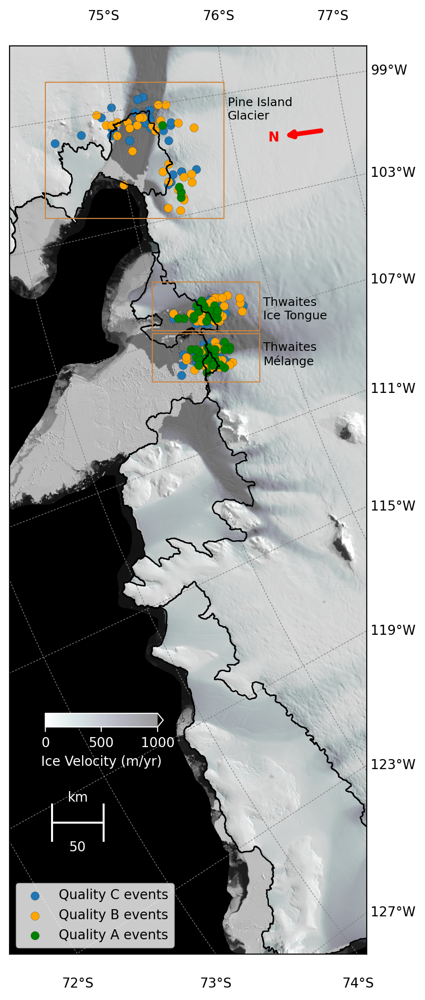

In [13]:
def map_plotter(axes=None):
    if axes is None:
        fig = plt.figure(figsize=(4, 10))
        ax = fig.add_axes([0.05,0.95, 0.95, 0.95])
    else:
        ax = axes
    m = Basemap(epsg='3031', ax=ax, llcrnrlon=-122, llcrnrlat = -71.5, urcrnrlon=-98, urcrnrlat=-77.3)

    m.drawparallels(np.arange(-78,-71,1), labels=[0,0,1,1], latmax=89, dashes=(3, 2), linewidth=.5, color='gray')
    m.drawmeridians(np.arange(-127,-97,4), labels=[0,1,0,0], latmax=89, dashes=(3, 2), linewidth=.5, color='gray')

    # coastlines
    m.readshapefile('Coastlines/moa2014_coastline_v01_wgs84', 'coastline', linewidth=1, zorder=2, color='k')
    # for info, shape in zip(m.coastline_info, m.coastline): ax.fill(*zip(*shape), 'lightblue', zorder=1)
    # grounding lines
    m.readshapefile('Groundinglines/moa2014_grounding_line_v01_wgs84', 'grounding', linewidth=1, zorder=2, color='k')
    # for info, shape in zip(m.grounding_info, m.grounding): ax.fill(*zip(*shape), 'lightgray', zorder=1)
    # # stations
    # stations = m.scatter(sta_lons, sta_lats, s=10, marker='^', latlon=True, label='Stations')
    # m.ax.legend(fontsize='20', loc='lower left')

    xminb, yminb = stere_proj(m.llcrnrlon, m.llcrnrlat)
    xmaxb, ymaxb = stere_proj(m.urcrnrlon, m.urcrnrlat)
    # background topographic image
    tmp = img_data[np.logical_and(yminb<=img_y, img_y<=ymaxb)][:, np.logical_and(xminb<=img_x, img_x<=xmaxb)]
    m.imshow(tmp, cmap='gray', origin='upper', vmax=2.2e4)
    # ice velocity data
    tmp = speed_data[np.logical_and(yminb<=speed_y, speed_y<=ymaxb)][:, np.logical_and(xminb<=speed_x, speed_x<=xmaxb)]
    mappable = m.imshow(tmp, cmap='bone_r', origin='upper', alpha=.4, vmin=0, vmax=1e3)

    # lucas = mc.scatter(l_lons, l_lats, c='k', marker='X', s=150, latlon=True, label='Lucas et al. (2021)')
    PIG_C = m.scatter(PIG_events_Cqual['lons'], PIG_events_Cqual['lats'], c='tab:blue', edgecolors='k', linewidth=0.1, marker='o', s=40, latlon=True, label='Quality C events')
    PIG_B = m.scatter(PIG_events_Bqual['lons'], PIG_events_Bqual['lats'], c='orange', edgecolors='k', linewidth=0.1, marker='o', s=40, latlon=True, label='Quality B events')
    PIG_A = m.scatter(PIG_events_Aqual['lons'], PIG_events_Aqual['lats'], c='green', edgecolors='k', linewidth=0.1, marker='o', s=40, latlon=True, label='Quality A events')

    MEL_C = m.scatter(MEL_events_Cqual['lons'], MEL_events_Cqual['lats'], c='tab:blue', edgecolors='k', linewidth=0.1, marker='o', s=40, latlon=True)
    MEL_B = m.scatter(MEL_events_Bqual['lons'], MEL_events_Bqual['lats'], c='orange', edgecolors='k', linewidth=0.1, marker='o', s=40, latlon=True)
    MEL_A = m.scatter(MEL_events_Aqual['lons'], MEL_events_Aqual['lats'], c='green', edgecolors='k', linewidth=0.1, marker='o', s=40, latlon=True)

    TON_C = m.scatter(TON_events_Cqual['lons'], TON_events_Cqual['lats'], c='tab:blue', edgecolors='k', linewidth=0.1, marker='o', s=40, latlon=True)
    TON_B = m.scatter(TON_events_Bqual['lons'], TON_events_Bqual['lats'], c='orange', edgecolors='k', linewidth=0.1, marker='o', s=40, latlon=True)
    TON_A = m.scatter(TON_events_Aqual['lons'], TON_events_Aqual['lats'], c='green', edgecolors='k', linewidth=0.1, marker='o', s=40, latlon=True)


    # adding a legend
    m.ax.legend(loc='lower left', fontsize=10)

    # Ice velocity colourbar
    cax = ax.inset_axes([0.1, 0.25, 0.33, 0.015])
    cbar = ax.figure.colorbar(mappable, cax=cax, orientation='horizontal', label='Ice Velocity (m/yr)', extend='max')
    cbar.ax.xaxis.label.set_color('white')
    cbar.ax.tick_params(color='white', labelcolor='white')
    for spine in cbar.ax.spines.values():
        spine.set_edgecolor('white')
    # cbar.ax.xaxis.label.set_fontsize(20)
    # cbar.ax.tick_params(labelsize=20)

    # scale bar
    m.drawmapscale(*(-119.8, -72.6), *(-119.8, -72.6), length=50, units='km', fontsize=10, zorder=3, linewidth=1.5, fontcolor='white')

    m.ax.annotate('N', xy=m(-101, -76.8), xytext=m(-101, -76.3), fontsize=10, fontweight='bold', color='r',
                arrowprops=dict(arrowstyle='<|-', linewidth=3.5, color='r'))

    m.ax.text(0.61, 0.93, 'Pine Island \nGlacier', c='k', fontsize=9, ha='left', va='center', transform=m.ax.transAxes)
    box_xx = [0.1, 0.1, 0.6, 0.6, 0.1]
    box_yy = [0.81, 0.96, 0.96, 0.81, 0.81]
    m.plot(box_xx, box_yy, c='peru', ls='-', lw=.8, transform=m.ax.transAxes)

    m.ax.text(0.71, 0.71, 'Thwaites \nIce Tongue', c='k', fontsize=9, ha='left', va='center', transform=m.ax.transAxes)
    box_xx = [0.4, 0.4, 0.7, 0.7, 0.4]
    box_yy = [0.686, 0.74, 0.74, 0.686, 0.686]
    m.plot(box_xx, box_yy, c='peru', ls='-', lw=.8, transform=m.ax.transAxes)

    m.ax.text(0.71, 0.66, 'Thwaites \nMélange', c='k', fontsize=9, ha='left', va='center', transform=m.ax.transAxes)
    box_xx = [0.4, 0.4, 0.7, 0.7, 0.4]
    box_yy = [0.63, 0.683, 0.683, 0.63, 0.63]
    m.plot(box_xx, box_yy, c='peru', ls='-', lw=.8, transform=m.ax.transAxes)
    
    if axes is None:
        fig.tight_layout()
        plt.show()
        
    return ax

mapp = map_plotter()

In [14]:
import pickle

In [15]:
# I'm just going to download them again

# signals_PIG_aqual = Stream()
# signals_PIG_aqual.clear()

# begin_PIG_aqual, end_PIG_aqual, arrive_PIG_aqual = [], [], []

# for i in range(len(sta_lats)):
#     for j in range(len(PIG_events_Aqual['lats'])):
#         diste = distance(sta_lats[i], sta_lons[i], PIG_events_Aqual['lats'][j], PIG_events_Aqual['lons'][j]) / 1000
#         if diste <= 1000:
#             evente_time = obspy.UTCDateTime(PIG_events_Aqual['times'][j])
#             if evente_time >= obspy.UTCDateTime(station_start_times[i]) and evente_time <= obspy.UTCDateTime(station_end_times[i]):
#                 print('PIG event:', j, 'Station:', i, 'Distance:', diste)
#                 try:
#                     back_az = back_azimuth(sta_lats[i], sta_lons[i], PIG_events_Aqual['lats'][j], PIG_events_Aqual['lons'][j])
#                     time_to_arrive = diste / 2.95
#                     begin_time = evente_time + time_to_arrive - 400
#                     end_time = evente_time + time_to_arrive + 400
#                     arrive_time = evente_time + time_to_arrive
                    
#                     st = ap.get_waveforms(network=networks_flat[i], station=stations_flat[i], location='*', channel='LHZ,LHN,LHE',
#                                           starttime=begin_time, endtime=end_time)
#                     st.remove_response(inventory=inv_LH, output='DISP', taper=True, taper_fraction=0.15)
#                     for tr in st:
#                         tr.stats.update({'arrival': arrive_time})
#                         tr.stats.update({'baz': back_az})
#                         tr.stats.update({'distancey': diste})
#                         tr.stats.update({'idx': j})
#                     signals_PIG_aqual += st
#                     begin_PIG_aqual.append(begin_time)
#                     end_PIG_aqual.append(end_time)
#                     arrive_PIG_aqual.append(arrive_time)
#                 except Exception as e:
#                     print(f"Error processing station {i}: {e}")
                    
# print('Number of traces downloaded for PIG A qual:', len(signals_PIG_aqual))

# # signals_PIG_aqual
# signals_PIG_aqual_filt = signals_PIG_aqual.copy()

# signals_PIG_aqual_filt.detrend('linear')
# signals_PIG_aqual_filt.detrend('demean')
# signals_PIG_aqual_filt.taper(max_percentage=0.1)

# signals_PIG_aqual_10_100 = signals_PIG_aqual_filt.copy()
# signals_PIG_aqual_17_25  = signals_PIG_aqual_filt.copy()

# signals_PIG_aqual_10_100.filter('bandpass', freqmin=0.01, freqmax=0.1, corners=3, zerophase=True)
# signals_PIG_aqual_17_25.filter('bandpass', freqmin=0.04, freqmax=0.06, corners=3, zerophase=True)

# for tr in signals_PIG_aqual_10_100.select(component='Z'):
#     # Select matching components with same arrival time
#     matching_traces = Stream([t for t in signals_PIG_aqual_10_100 
#                             if (t.stats.network == tr.stats.network and 
#                                 t.stats.station == tr.stats.station and 
#                                 t.stats.arrival == tr.stats.arrival)])
    
#     if len(matching_traces) == 3:  # Check if we have all components
#         try:
#             matching_traces.trim(tr.stats.arrival-200, tr.stats.arrival+200)
            
#             # Interpolate to exactly 400 samples
#             for trace in matching_traces:
#                 new_npts = 400
#                 new_times = np.linspace(trace.times()[0], trace.times()[-1], new_npts)
#                 trace.data = np.interp(new_times, trace.times(), trace.data)
#                 trace.stats.npts = new_npts
            
#             matching_traces.rotate('NE->RT', back_azimuth=tr.stats.baz)
#         except Exception as e:
#             print(f"Error processing {tr.id}: {e}")
#     else:
#         print(f"Missing components for {tr.id}, found {len(matching_traces)} traces")
    
# for tr in signals_PIG_aqual_17_25.select(component='Z'):
#     # Select matching components with same arrival time
#     matching_traces = Stream([t for t in signals_PIG_aqual_17_25
#                             if (t.stats.network == tr.stats.network and
#                                 t.stats.station == tr.stats.station and
#                                 t.stats.arrival == tr.stats.arrival)])
    
#     if len(matching_traces) == 3:  # Check if we have all components
#         try:
#             matching_traces.trim(tr.stats.arrival-200, tr.stats.arrival+200)
            
#             # Interpolate to exactly 400 samples
#             for trace in matching_traces:
#                 new_npts = 400
#                 new_times = np.linspace(trace.times()[0], trace.times()[-1], new_npts)
#                 trace.data = np.interp(new_times, trace.times(), trace.data)
#                 trace.stats.npts = new_npts
            
#             matching_traces.rotate('NE->RT', back_azimuth=tr.stats.baz)
#         except Exception as e:
#             print(f"Error processing {tr.id}: {e}")
#     else:
#         print(f"Missing components for {tr.id}, found {len(matching_traces)} traces")
    
# signals_PIG_aqual_10_100.taper(max_percentage=0.15)
# signals_PIG_aqual_17_25.taper(max_percentage=0.15)

# sig_PIG_aqual = [signals_PIG_aqual, signals_PIG_aqual_10_100, signals_PIG_aqual_17_25]

with open('sig_PIG_aqual.pkl', 'rb') as f:
    sig_PIG_aqual = pickle.load(f)
    
signals_PIG_aqual, signals_PIG_aqual_10_100, signals_PIG_aqual_17_25 = sig_PIG_aqual
    
print('Number of traces downloaded for PIG A qual:', len(signals_PIG_aqual))


Number of traces downloaded for PIG A qual: 231


In [16]:
# signals_PIG_all = Stream()
# signals_PIG_all.clear()

# begin_PIG_all, end_PIG_all, arrive_PIG_all = [], [], []

# for i in range(len(sta_lats)):
#     for j in range(len(PIG_events['lats'])):
#         diste = distance(sta_lats[i], sta_lons[i], PIG_events['lats'][j], PIG_events['lons'][j]) / 1000
#         if diste <= 1000:
#             evente_time = obspy.UTCDateTime(PIG_events['times'][j])
#             if evente_time >= obspy.UTCDateTime(station_start_times[i]) and evente_time <= obspy.UTCDateTime(station_end_times[i]):
#                 print('PIG event:', j, 'Station:', i, 'Distance:', diste)
#                 try:
#                     back_az = back_azimuth(sta_lats[i], sta_lons[i], PIG_events['lats'][j], PIG_events['lons'][j])
#                     time_to_arrive = diste / 2.95
#                     begin_time = evente_time + time_to_arrive - 400
#                     end_time = evente_time + time_to_arrive + 400
#                     arrive_time = evente_time + time_to_arrive
                    
#                     st = ap.get_waveforms(network=networks_flat[i], station=stations_flat[i], location='*', channel='LHZ,LHN,LHE',
#                                           starttime=begin_time, endtime=end_time)
#                     st.remove_response(inventory=inv_LH, output='DISP', taper=True, taper_fraction=0.15)
#                     for tr in st:
#                         tr.stats.update({'arrival': arrive_time})
#                         tr.stats.update({'baz': back_az})
#                         tr.stats.update({'distancey': diste})
#                         tr.stats.update({'idx': j})
#                     signals_PIG_all += st
#                     begin_PIG_all.append(begin_time)
#                     end_PIG_all.append(end_time)
#                     arrive_PIG_all.append(arrive_time)
#                 except Exception as e:
#                     print(f"Error processing station {i}: {e}")
                    
# print('Number of traces downloaded for PIG all:', len(signals_PIG_all))

# signals_PIG_all_filt = signals_PIG_all.copy()

# signals_PIG_all_filt.detrend('linear')
# signals_PIG_all_filt.detrend('demean')
# signals_PIG_all_filt.taper(max_percentage=0.1)

# signals_PIG_all_10_100 = signals_PIG_all_filt.copy()
# signals_PIG_all_17_25  = signals_PIG_all_filt.copy()

# signals_PIG_all_10_100.filter('bandpass', freqmin=0.01, freqmax=0.1, corners=3, zerophase=True)
# signals_PIG_all_17_25.filter('bandpass', freqmin=0.04, freqmax=0.06, corners=3, zerophase=True)

# PIG_all_10_100 = Stream()
# PIG_all_10_100.clear()
# for tr in signals_PIG_all_10_100.select(component='Z'):
#     # Select matching components with same arrival time
#     matching_traces = Stream([t for t in signals_PIG_all_10_100
#                             if (t.stats.network == tr.stats.network and
#                                 t.stats.station == tr.stats.station and
#                                 t.stats.arrival == tr.stats.arrival)])
    
#     if len(matching_traces) == 3:  # Check if we have all components
#         try:
#             matching_traces.trim(tr.stats.arrival-200, tr.stats.arrival+200)
            
#             # Interpolate to exactly 400 samples
#             for trace in matching_traces:
#                 new_npts = 400
#                 new_times = np.linspace(trace.times()[0], trace.times()[-1], new_npts)
#                 trace.data = np.interp(new_times, trace.times(), trace.data)
#                 trace.stats.npts = new_npts
            
#             matching_traces.rotate('NE->RT', back_azimuth=tr.stats.baz)
            
#             for trace in matching_traces:
#                 PIG_all_10_100 += trace
            
#         except Exception as e:
#             print(f"Error processing {tr.id}: {e}")
#     else:
#         print(f"Missing components for {tr.id}, found {len(matching_traces)} traces")

# PIG_all_17_25 = Stream()
# PIG_all_17_25.clear()    
# for tr in signals_PIG_all_17_25.select(component='Z'):
#     # Select matching components with same arrival time
#     matching_traces = Stream([t for t in signals_PIG_all_17_25
#                             if (t.stats.network == tr.stats.network and
#                                 t.stats.station == tr.stats.station and
#                                 t.stats.arrival == tr.stats.arrival)])
    
#     if len(matching_traces) == 3:  # Check if we have all components
#         try:
#             matching_traces.trim(tr.stats.arrival-200, tr.stats.arrival+200)
            
#             # Interpolate to exactly 400 samples
#             for trace in matching_traces:
#                 new_npts = 400
#                 new_times = np.linspace(trace.times()[0], trace.times()[-1], new_npts)
#                 trace.data = np.interp(new_times, trace.times(), trace.data)
#                 trace.stats.npts = new_npts
            
#             matching_traces.rotate('NE->RT', back_azimuth=tr.stats.baz)
            
#             for trace in matching_traces:
#                 PIG_all_17_25 += trace
#         except Exception as e:
#             print(f"Error processing {tr.id}: {e}")
#     else:
#         print(f"Missing components for {tr.id}, found {len(matching_traces)} traces")
    
# signals_PIG_all_10_100.taper(max_percentage=0.15)
# signals_PIG_all_17_25.taper(max_percentage=0.15)

# sig_PIG_all = [signals_PIG_all, PIG_all_10_100, PIG_all_17_25]

with open('sig_PIG_all.pkl', 'rb') as f:
    sig_PIG_all = pickle.load(f)

signals_PIG_all, PIG_all_10_100, PIG_all_17_25 = sig_PIG_all

print('Number of traces downloaded for PIG all:', len(signals_PIG_all))

Number of traces downloaded for PIG all: 3015


In [17]:
# signals_MEL = Stream()
# signals_MEL.clear()

# begin_MEL, end_MEL, arrive_MEL = [], [], []

# for i in range(len(sta_lats)):
#     for j in range(len(MEL_events_Aqual['lats'])):
#         diste = distance(sta_lats[i], sta_lons[i], MEL_events_Aqual['lats'][j], MEL_events_Aqual['lons'][j]) / 1000
#         if diste <= 1000:
#             evente_time = obspy.UTCDateTime(MEL_events_Aqual['times'][j])
#             if evente_time >= obspy.UTCDateTime(station_start_times[i]) and evente_time <= obspy.UTCDateTime(station_end_times[i]):
#                 print('Mel event:', j, 'Station:', i, 'Distance:', diste)
#                 try:
#                     back_az = back_azimuth(sta_lats[i], sta_lons[i], MEL_events_Aqual['lats'][j], MEL_events_Aqual['lons'][j])
#                     time_to_arrive = diste / 2.95
#                     begin_time = evente_time + time_to_arrive - 400
#                     end_time = evente_time + time_to_arrive + 400
#                     arrive_time = evente_time + time_to_arrive
                    
#                     st = ap.get_waveforms(network=networks_flat[i], station=stations_flat[i], location='*', channel='LHZ,LHN,LHE',
#                                           starttime=begin_time, endtime=end_time)
#                     st.remove_response(inventory=inv_LH, output='DISP', taper=True, taper_fraction=0.15)
#                     for tr in st:
#                         tr.stats.update({'arrival': arrive_time})
#                         tr.stats.update({'baz': back_az})
#                         tr.stats.update({'distancey': diste})
#                         tr.stats.update({'idx': j})
#                     signals_MEL += st
#                     begin_MEL.append(begin_time)
#                     end_MEL.append(end_time)
#                     arrive_MEL.append(arrive_time)
#                 except Exception as e:
#                     print(f"Error processing station {i}: {e}")
                    
# print('Number of traces downloaded for Mélange:', len(signals_MEL))

# signals_MEL_filt = signals_MEL.copy()

# signals_MEL_filt.detrend('linear')
# signals_MEL_filt.detrend('demean')
# signals_MEL_filt.taper(max_percentage=0.1)

# signals_MEL_10_100 = signals_MEL_filt.copy()
# signals_MEL_17_25  = signals_MEL_filt.copy()

# signals_MEL_10_100.filter('bandpass', freqmin=0.01, freqmax=0.1, corners=3, zerophase=True)
# signals_MEL_17_25.filter('bandpass', freqmin=0.04, freqmax=0.06, corners=3, zerophase=True)

# MEL_10_100 = Stream()
# MEL_10_100.clear()
# for tr in signals_MEL_10_100.select(component='Z'):
#     # Select matching components with same arrival time
#     matching_traces = Stream([t for t in signals_MEL_10_100
#                             if (t.stats.network == tr.stats.network and
#                                 t.stats.station == tr.stats.station and
#                                 t.stats.arrival == tr.stats.arrival)])
    
#     if len(matching_traces) == 3:  # Check if we have all components
#         try:
#             matching_traces.trim(tr.stats.arrival-200, tr.stats.arrival+200)
            
#             # Interpolate to exactly 400 samples
#             for trace in matching_traces:
#                 new_npts = 400
#                 new_times = np.linspace(trace.times()[0], trace.times()[-1], new_npts)
#                 trace.data = np.interp(new_times, trace.times(), trace.data)
#                 trace.stats.npts = new_npts
            
#             matching_traces.rotate('NE->RT', back_azimuth=tr.stats.baz)
            
#             for trace in matching_traces:
#                 MEL_10_100 += trace
#         except Exception as e:
#             print(f"Error processing {tr.id}: {e}")
#     else:
#         print(f"Missing components for {tr.id}, found {len(matching_traces)} traces")
    
# MEL_17_25 = Stream()
# MEL_17_25.clear()    
# for tr in signals_MEL_17_25.select(component='Z'):
#     # Select matching components with same arrival time
#     matching_traces = Stream([t for t in signals_MEL_17_25
#                             if (t.stats.network == tr.stats.network and
#                                 t.stats.station == tr.stats.station and
#                                 t.stats.arrival == tr.stats.arrival)])
    
#     if len(matching_traces) == 3:  # Check if we have all components
#         try:
#             matching_traces.trim(tr.stats.arrival-200, tr.stats.arrival+200)
            
#             # Interpolate to exactly 400 samples
#             for trace in matching_traces:
#                 new_npts = 400
#                 new_times = np.linspace(trace.times()[0], trace.times()[-1], new_npts)
#                 trace.data = np.interp(new_times, trace.times(), trace.data)
#                 trace.stats.npts = new_npts
            
#             matching_traces.rotate('NE->RT', back_azimuth=tr.stats.baz)
            
#             for trace in matching_traces:
#                 MEL_17_25 += trace
#         except Exception as e:
#             print(f"Error processing {tr.id}: {e}")
#     else:
#         print(f"Missing components for {tr.id}, found {len(matching_traces)} traces")
    
# signals_MEL_10_100.taper(max_percentage=0.15)
# signals_MEL_17_25.taper(max_percentage=0.15)

# sig_MEL = [signals_MEL, MEL_10_100, MEL_17_25]

with open('sig_MEL.pkl', 'rb') as f:
    sig_MEL = pickle.load(f)

signals_MEL, MEL_10_100, MEL_17_25 = sig_MEL

print('Number of traces downloaded for MEL:', len(signals_MEL))

Number of traces downloaded for MEL: 1363


In [18]:
# signals_TON = Stream()
# signals_TON.clear()

# begin_TON, end_TON, arrive_TON = [], [], []

# for i in range(len(sta_lats)):
#     for j in range(len(TON_events_Aqual['lats'])):
#         diste = distance(sta_lats[i], sta_lons[i], TON_events_Aqual['lats'][j], TON_events_Aqual['lons'][j]) / 1000
#         if diste <= 1000:
#             evente_time = obspy.UTCDateTime(TON_events_Aqual['times'][j])
#             if evente_time >= obspy.UTCDateTime(station_start_times[i]) and evente_time <= obspy.UTCDateTime(station_end_times[i]):
#                 print('TON event:', j, 'Station:', i, 'Distance:', diste)
#                 try:
#                     back_az = back_azimuth(sta_lats[i], sta_lons[i], TON_events_Aqual['lats'][j], TON_events_Aqual['lons'][j])
#                     time_to_arrive = diste / 2.95
#                     begin_time = evente_time + time_to_arrive - 400
#                     end_time = evente_time + time_to_arrive + 400
#                     arrive_time = evente_time + time_to_arrive
                    
#                     st = ap.get_waveforms(network=networks_flat[i], station=stations_flat[i], location='*', channel='LHZ,LHN,LHE',
#                                           starttime=begin_time, endtime=end_time)
#                     st.remove_response(inventory=inv_LH, output='DISP', taper=True, taper_fraction=0.15)
#                     for tr in st:
#                         tr.stats.update({'arrival': arrive_time})
#                         tr.stats.update({'baz': back_az})
#                         tr.stats.update({'distancey': diste})
#                         tr.stats.update({'idx': j})
#                     signals_TON += st
#                     begin_TON.append(begin_time)
#                     end_TON.append(end_time)
#                     arrive_TON.append(arrive_time)
#                 except Exception as e:
#                     print(f"Error processing station {i}: {e}")
                    
# print('Number of traces downloaded for Tongue:', len(signals_TON))

# signals_TON_filt = signals_TON.copy()

# signals_TON_filt.detrend('linear')
# signals_TON_filt.detrend('demean')
# signals_TON_filt.taper(max_percentage=0.1)

# signals_TON_10_100 = signals_TON_filt.copy()
# signals_TON_17_25  = signals_TON_filt.copy()

# signals_TON_10_100.filter('bandpass', freqmin=0.01, freqmax=0.1, corners=3, zerophase=True)
# signals_TON_17_25.filter('bandpass', freqmin=0.04, freqmax=0.06, corners=3, zerophase=True)

# TON_10_100 = Stream()
# TON_10_100.clear()
# for tr in signals_TON_10_100.select(component='Z'):
#     # Select matching components with same arrival time
#     matching_traces = Stream([t for t in signals_TON_10_100
#                             if (t.stats.network == tr.stats.network and
#                                 t.stats.station == tr.stats.station and
#                                 t.stats.arrival == tr.stats.arrival)])
    
#     if len(matching_traces) == 3:  # Check if we have all components
#         try:
#             matching_traces.trim(tr.stats.arrival-200, tr.stats.arrival+200)
            
#             # Interpolate to exactly 400 samples
#             for trace in matching_traces:
#                 new_npts = 400
#                 new_times = np.linspace(trace.times()[0], trace.times()[-1], new_npts)
#                 trace.data = np.interp(new_times, trace.times(), trace.data)
#                 trace.stats.npts = new_npts
            
#             matching_traces.rotate('NE->RT', back_azimuth=tr.stats.baz)
#             for trace in matching_traces:
#                 TON_10_100 += trace
#         except Exception as e:
#             print(f"Error processing {tr.id}: {e}")
#     else:
#         print(f"Missing components for {tr.id}, found {len(matching_traces)} traces")
    
# TON_17_25 = Stream()
# TON_17_25.clear()
# for tr in signals_TON_17_25.select(component='Z'):
#     # Select matching components with same arrival time
#     matching_traces = Stream([t for t in signals_TON_17_25
#                             if (t.stats.network == tr.stats.network and
#                                 t.stats.station == tr.stats.station and
#                                 t.stats.arrival == tr.stats.arrival)])
    
#     if len(matching_traces) == 3:  # Check if we have all components
#         try:
#             matching_traces.trim(tr.stats.arrival-200, tr.stats.arrival+200)
            
#             # Interpolate to exactly 400 samples
#             for trace in matching_traces:
#                 new_npts = 400
#                 new_times = np.linspace(trace.times()[0], trace.times()[-1], new_npts)
#                 trace.data = np.interp(new_times, trace.times(), trace.data)
#                 trace.stats.npts = new_npts
            
#             matching_traces.rotate('NE->RT', back_azimuth=tr.stats.baz)
#             for trace in matching_traces:
#                 TON_17_25 += trace
#         except Exception as e:
#             print(f"Error processing {tr.id}: {e}")
#     else:
#         print(f"Missing components for {tr.id}, found {len(matching_traces)} traces")
    
# signals_TON_10_100.taper(max_percentage=0.15)
# signals_TON_17_25.taper(max_percentage=0.15)

# sig_TON = [signals_TON, TON_10_100, TON_17_25]

with open('sig_TON.pkl', 'rb') as f:
    sig_TON = pickle.load(f)
    
signals_TON, TON_10_100, TON_17_25 = sig_TON
    
print('Number of traces downloaded for TON:', len(signals_TON))

Number of traces downloaded for TON: 1346


In [19]:
# # I'm not really comparing amplitudes between locations
# # so try normalising all the traces at each station? or even each station each event? 
# # don't see a good reason why not to do it for each station each event
# # except that it doesn't really let us filter out the shit stations anymore <<<<<< not worth it!

# norm_TON_17_25 = TON_17_25.copy()

# for tr in norm_TON_17_25.select(component='Z'):
#     # Select matching components with same arrival time
#     matching_traces = Stream([t for t in norm_TON_17_25
#                             if (t.stats.network == tr.stats.network and
#                                 t.stats.station == tr.stats.station and
#                                 t.stats.arrival == tr.stats.arrival)])
#     max_amps = []
#     for trace in matching_traces:
#         max_amps.append(np.max(np.abs(trace.data)))
#     max_amp = np.max(max_amps)
#     if max_amp > 0:
#         for trace in matching_traces:
#             trace.data = trace.data / max_amp
#     else:
#         print(f"Max amplitude is zero for event at {tr.stats.arrival} at station {tr.stats.station}")
        

In [20]:
def qualcnorm(stream, minval, maxval, plot=False):
    quality_stream = Stream()
    quality_stream.clear()

    for trace in stream:
        if max(abs(trace.data)) > minval and max(abs(trace.data)) < maxval:
            if plot==True:
                plt.plot(trace.times(), trace.data)
                plt.ylim(-2,2)
            quality_stream.append(trace)
    
    return quality_stream

# testet = qualcnorm(norm_TON_17_25, 1e-10, 10, plot=True)

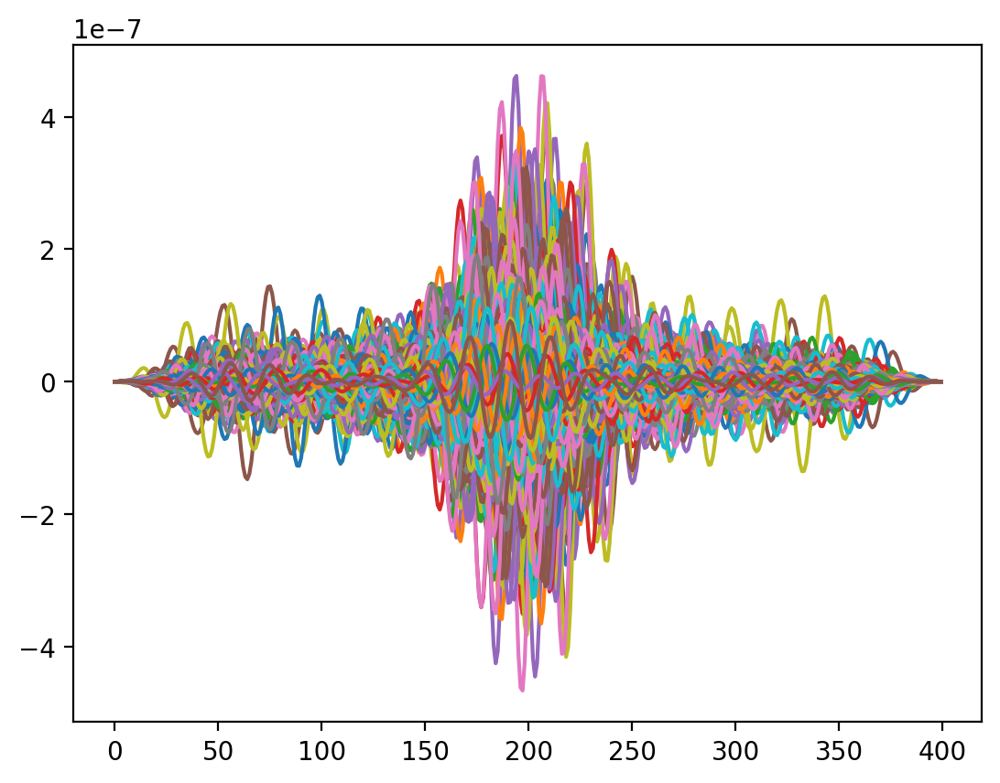

In [21]:
def qualc(stream, minval, maxval, plot=False):
    quality_stream = Stream()
    quality_stream.clear()

    for trace in stream:
        if max(abs(trace.data)) > minval and max(abs(trace.data)) < maxval:
            if np.argmax(abs(trace.data)) > 140 and np.argmax(abs(trace.data)) < 260: # works well for 25 may need to adjust back for 100
                if plot==True:
                    plt.plot(trace.times(), trace.data)
                quality_stream.append(trace)
    
    return quality_stream

# quality_PIG_25_R = qualc(PIG_25_R, 1e-10, 6e-7, plot=False)
# quality_PIG_25_T = qualc(PIG_25_T, 1e-10, 6e-7, plot=False)
# quality_PIG_100_Z = qualc(PIG_100_Z, 1e-10, 8e-7, plot=False)
# quality_PIG_100_R = qualc(PIG_100_R, 1e-10, 8e-7, plot=False)
# quality_PIG_100_T = qualc(PIG_100_T, 1e-10, 9e-7, plot=False)
# quality_MEL_25_Z = qualc(MEL_25_Z, 1e-10, 4.3e-7, plot=False)
# quality_MEL_25_R = qualc(MEL_25_R, 1e-10, 2.5e-7, plot=False)
# quality_MEL_25_T = qualc(MEL_25_T, 1e-10, 6.7e-7, plot=False)
# quality_MEL_100_Z = qualc(MEL_100_Z, 1e-10, 3e-6, plot=False)
# quality_MEL_100_R = qualc(MEL_100_R, 1e-10, 6e-7, plot=False)
# quality_MEL_100_T = qualc(MEL_100_T, 1e-10, 5.2e-7, plot=False)
# quality_TON_25_Z = qualc(TON_25_Z, 1e-10, 8e-7, plot=False)
# quality_TON_25_R = qualc(TON_25_R, 1e-10, 9e-7, plot=False)
# quality_TON_25_T = qualc(TON_25_T, 1e-10, 1.6e-6, plot=False)
# quality_TON_100_Z = qualc(TON_100_Z, 1e-10, 9.4e-7, plot=False)
# quality_TON_100_R = qualc(TON_100_R, 1e-8, 6.3e-7, plot=False)

quality_PIG_25_Z = qualc(signals_PIG_aqual_17_25.select(component='Z'), 1e-10, 1e-4, plot=False)
quality_PIG_25_R = qualc(signals_PIG_aqual_17_25.select(component='R'), 1e-10, 6e-7, plot=False)
quality_PIG_25_T = qualc(signals_PIG_aqual_17_25.select(component='T'), 1e-10, 6e-7, plot=False)
quality_PIG_100_Z = qualc(signals_PIG_aqual_10_100.select(component='Z'), 1e-10, 8e-7, plot=False)
quality_PIG_100_R = qualc(signals_PIG_aqual_10_100.select(component='R'), 1e-10, 8e-7, plot=False)
quality_PIG_100_T = qualc(signals_PIG_aqual_10_100.select(component='T'), 1e-10, 9e-7, plot=False)
quality_MEL_25_Z = qualc(MEL_17_25.select(component='Z'), 1e-10, 4.3e-7, plot=False)
quality_MEL_25_R = qualc(MEL_17_25.select(component='R'), 1e-10, 2.5e-7, plot=False)
quality_MEL_25_T = qualc(MEL_17_25.select(component='T'), 1e-10, 6.7e-7, plot=False)
quality_MEL_100_Z = qualc(MEL_10_100.select(component='Z'), 1e-10, 3e-6, plot=False)
quality_MEL_100_R = qualc(MEL_10_100.select(component='R'), 1e-10, 6e-7, plot=False)
quality_MEL_100_T = qualc(MEL_10_100.select(component='T'), 1e-10, 5.2e-7, plot=False)
quality_TON_25_Z = qualc(TON_17_25.select(component='Z'), 1e-10, 8e-7, plot=False)
quality_TON_25_R = qualc(TON_17_25.select(component='R'), 1e-10, 9e-7, plot=False)
quality_TON_25_T = qualc(TON_17_25.select(component='T'), 1e-10, 1.6e-6, plot=False)
quality_TON_100_Z = qualc(TON_10_100.select(component='Z'), 1e-10, 9.4e-7, plot=False)
quality_TON_100_R = qualc(TON_10_100.select(component='R'), 1e-8, 6.3e-7, plot=False)
quality_TON_100_T = qualc(TON_10_100.select(component='T'), 1e-10, 1.5e-6, plot=False)

quality_PIG_all_100_Z = qualc(PIG_all_10_100.select(component='Z'), 5e-9, 8e-7, plot=False)
quality_PIG_all_100_R = qualc(PIG_all_10_100.select(component='R'), 5e-9, 1e-6, plot=False)
quality_PIG_all_100_T = qualc(PIG_all_10_100.select(component='T'), 5e-9, 1e-6, plot=False)

quality_PIG_all_25_Z = qualc(PIG_all_17_25.select(component='Z'), 5e-9, 6e-7, plot=True)
quality_PIG_all_25_R = qualc(PIG_all_17_25.select(component='R'), 5e-9, 6e-7, plot=False)
quality_PIG_all_25_T = qualc(PIG_all_17_25.select(component='T'), 5e-9, 6.5e-7, plot=False)


In [22]:
quality_PIG_25_Z

75 Trace(s) in Stream:

XH.RS14..LHZ | 2016-01-03T05:00:03.000000Z - 2016-01-03T05:06:42.000000Z | 1.0 Hz, 400 samples
...
(73 other traces)
...
YT.WHIT..LHZ | 2018-06-30T20:58:24.000000Z - 2018-06-30T21:05:03.000000Z | 1.0 Hz, 400 samples

[Use "print(Stream.__str__(extended=True))" to print all Traces]

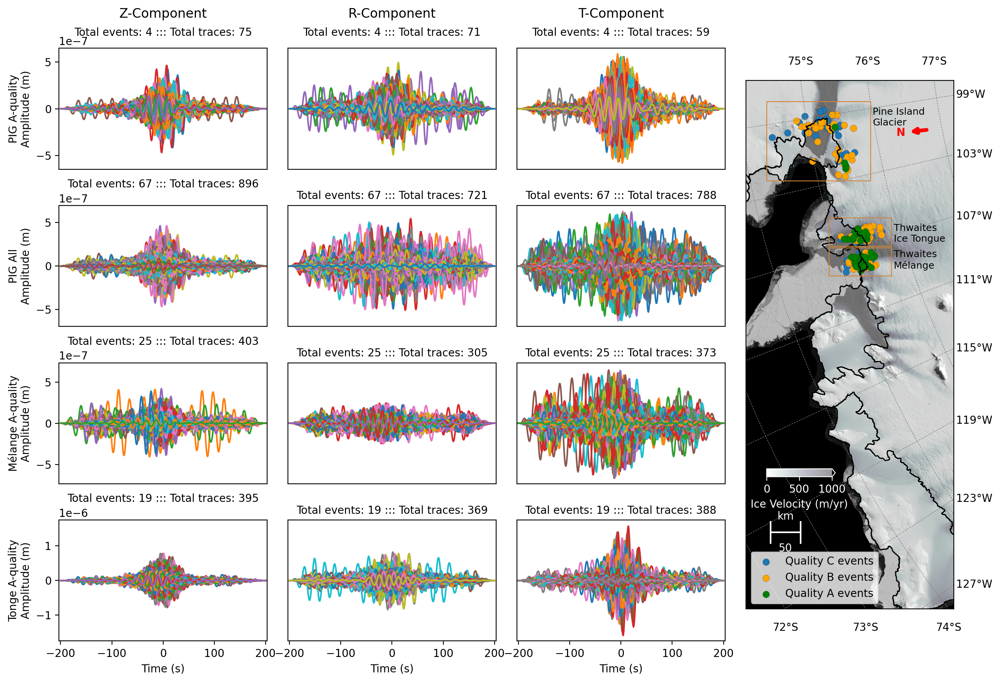

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np

# Create figure
fig = plt.figure(figsize=(15, 10))

amplitude_xaxis = np.linspace(-200, 200, 400)

# Create main grid with 4 columns of equal width
gs = gridspec.GridSpec(1, 4, figure=fig, width_ratios=[1, 1, 1, 1], wspace=0.1)


# Create subgrids for first 3 columns
gs_col1 = gridspec.GridSpecFromSubplotSpec(4, 1, subplot_spec=gs[0], hspace=0.3)
gs_col2 = gridspec.GridSpecFromSubplotSpec(4, 1, subplot_spec=gs[1], hspace=0.3)
gs_col3 = gridspec.GridSpecFromSubplotSpec(4, 1, subplot_spec=gs[2], hspace=0.3)

# Create plots for first column
ax1_1 = fig.add_subplot(gs_col1[0])
ax1_2 = fig.add_subplot(gs_col1[1])
ax1_3 = fig.add_subplot(gs_col1[2])
ax1_4 = fig.add_subplot(gs_col1[3])

# Create plots for second column
ax2_1 = fig.add_subplot(gs_col2[0])
ax2_2 = fig.add_subplot(gs_col2[1])
ax2_3 = fig.add_subplot(gs_col2[2])
ax2_4 = fig.add_subplot(gs_col2[3])

# Create plots for third column
ax3_1 = fig.add_subplot(gs_col3[0])
ax3_2 = fig.add_subplot(gs_col3[1])
ax3_3 = fig.add_subplot(gs_col3[2])
ax3_4 = fig.add_subplot(gs_col3[3])

# Create one long plot for fourth column
ax4 = fig.add_subplot(gs[3])
map_plotter(axes=ax4)

axes_set = [ax1_1, ax1_2, ax1_3, ax1_4,
            ax2_1, ax2_2, ax2_3, ax2_4,
            ax3_1, ax3_2, ax3_3, ax3_4]

data_streams = [quality_PIG_25_Z, quality_PIG_all_25_Z, quality_MEL_25_Z, quality_TON_25_Z,
                quality_PIG_25_R, quality_PIG_all_25_R, quality_MEL_25_R, quality_TON_25_R,
                quality_PIG_25_T, quality_PIG_all_25_T, quality_MEL_25_T, quality_TON_25_T]

for ax, stream in zip(axes_set, data_streams):
    for tr in stream:
        ax.plot(amplitude_xaxis, tr.data)
    # ax.set_xticks([])  # Remove x ticks for cleaner look
    # ax.set_yticks([])  # Remove y ticks for cleaner look

ax1_1.set_xticks([])
ax1_2.set_xticks([])
ax1_3.set_xticks([])
ax2_1.set_xticks([])
ax2_2.set_xticks([])
ax2_3.set_xticks([])
ax3_1.set_xticks([])
ax3_2.set_xticks([])
ax3_3.set_xticks([])

ax2_1.set_yticks([])
ax2_2.set_yticks([])
ax2_3.set_yticks([])
ax2_4.set_yticks([])
ax3_1.set_yticks([])
ax3_2.set_yticks([])
ax3_3.set_yticks([])
ax3_4.set_yticks([])

xmine, xmaxe = -203, 203
ax1_1.set_xlim(xmine, xmaxe)
ax2_1.set_xlim(xmine, xmaxe)
ax3_1.set_xlim(xmine, xmaxe)
ax1_2.set_xlim(xmine, xmaxe)
ax2_2.set_xlim(xmine, xmaxe)
ax3_2.set_xlim(xmine, xmaxe)
ax1_3.set_xlim(xmine, xmaxe)
ax2_3.set_xlim(xmine, xmaxe)
ax3_3.set_xlim(xmine, xmaxe)
ax1_4.set_xlim(xmine, xmaxe)
ax2_4.set_xlim(xmine, xmaxe)
ax3_4.set_xlim(xmine, xmaxe)

PIG_aqual_lim = np.max(np.abs([tr.data for tr in quality_PIG_25_Z] + [tr.data for tr in quality_PIG_25_R] + [tr.data for tr in quality_PIG_25_T]))*1.1
PIG_all_lim = np.max(np.abs([tr.data for tr in quality_PIG_all_25_Z] + [tr.data for tr in quality_PIG_all_25_R] + [tr.data for tr in quality_PIG_all_25_T]))*1.1
MEL_lim = np.max(np.abs([tr.data for tr in quality_MEL_25_Z] + [tr.data for tr in quality_MEL_25_R] + [tr.data for tr in quality_MEL_25_T]))*1.1
TON_lim = np.max(np.abs([tr.data for tr in quality_TON_25_Z] + [tr.data for tr in quality_TON_25_R] + [tr.data for tr in quality_TON_25_T]))*1.1


ax1_1.set_ylim(-PIG_aqual_lim, PIG_aqual_lim)
ax2_1.set_ylim(-PIG_aqual_lim, PIG_aqual_lim)
ax3_1.set_ylim(-PIG_aqual_lim, PIG_aqual_lim)
ax1_2.set_ylim(-PIG_all_lim, PIG_all_lim)
ax2_2.set_ylim(-PIG_all_lim, PIG_all_lim)
ax3_2.set_ylim(-PIG_all_lim, PIG_all_lim)
ax1_3.set_ylim(-MEL_lim, MEL_lim)
ax2_3.set_ylim(-MEL_lim, MEL_lim)
ax3_3.set_ylim(-MEL_lim, MEL_lim)
ax1_4.set_ylim(-TON_lim, TON_lim)
ax2_4.set_ylim(-TON_lim, TON_lim)
ax3_4.set_ylim(-TON_lim, TON_lim)

n_eventz = [len(PIG_events['lats']), len(MEL_events_Aqual['lats']), len(TON_events_Aqual['lats']), 
            len(PIG_events['lats']), len(MEL_events_Aqual['lats']), len(TON_events_Aqual['lats']), 
            len(PIG_events['lats']), len(MEL_events_Aqual['lats']), len(TON_events_Aqual['lats'])]
n_traces = [len(quality_PIG_all_25_Z), len(quality_MEL_25_Z), len(quality_TON_25_Z),
            len(quality_PIG_all_25_R), len(quality_MEL_25_R), len(quality_TON_25_R),
            len(quality_PIG_all_25_T), len(quality_MEL_25_T), len(quality_TON_25_T)]

for ax in [ax1_2, ax1_3, ax1_4,
           ax2_2, ax2_3, ax2_4,
           ax3_2, ax3_3, ax3_4]:
    index = [ax1_2, ax1_3, ax1_4,
             ax2_2, ax2_3, ax2_4,
             ax3_2, ax3_3, ax3_4].index(ax)
    ax.set_title('Total events: {} ::: Total traces: {}'.format(n_eventz[index], n_traces[index]), fontsize=10)

# Add titles
ax1_1.set_title('Z-Component', y=1.2)
ax1_1.text(0.5, 1.13, 'Total events: {} ::: Total traces: {}'.format(len(PIG_events_Aqual['lats']), len(quality_PIG_25_Z)), ha='center', va='center', transform=ax1_1.transAxes, fontsize=10)
ax2_1.set_title('R-Component', y=1.2)
ax2_1.text(0.5, 1.13, 'Total events: {} ::: Total traces: {}'.format(len(PIG_events_Aqual['lats']), len(quality_PIG_25_R)), ha='center', va='center', transform=ax2_1.transAxes, fontsize=10)
ax3_1.set_title('T-Component', y=1.2)
ax3_1.text(0.5, 1.13, 'Total events: {} ::: Total traces: {}'.format(len(PIG_events_Aqual['lats']), len(quality_PIG_25_T)), ha='center', va='center', transform=ax3_1.transAxes, fontsize=10)

ax1_1.set_ylabel('PIG A-quality\nAmplitude (m)')
ax1_2.set_ylabel('PIG All\nAmplitude (m)')
ax1_3.set_ylabel('Mélange A-quality\nAmplitude (m)')
ax1_4.set_ylabel('Tonge A-quality\nAmplitude (m)')

ax1_4.set_xlabel('Time (s)')
ax2_4.set_xlabel('Time (s)')
ax3_4.set_xlabel('Time (s)')

fig.savefig('ZRT_amplitudes.png', bbox_inches='tight')

plt.show()

In [24]:
from matplotlib.ticker import NullFormatter
import math
from matplotlib import mlab
from matplotlib.colors import Normalize
from scipy.signal import hilbert

def plot_fancy_norm_nontracey(traces, axes_dict=None, axlabel=True, xaxislabel=True):
    '''
    plot of spectrogram, signal, and FFT, with normalised and unnormalised averages in place
    '''
    ## spectrogram bit
    fs = 1.0  # sampling rate in Hz
    nfft = 128  # number of points in FFT
    pad_to = 1024  # padding to next power of 2
    noverlap = 115  # number of points to overlap between segments
    vmin, vmax = 0.0, 1.0  # color scale limits

    # extracting the data
    datas = []
    datas_times = []
    for trace in traces:
        if len(trace) > 300:  # somewhat arbitrary - we expect 400 and can't use 128 or below lengths
            datas.append(trace)
            datas_times.append(trace.times())

    if len(datas) == 0:
        return None

    datas_max = max([max(data) for data in datas])
    datas_min = min([min(data) for data in datas])

    # Hilbert envelopes
    envelopes = []
    envelopes_max = []
    envelopes_norm = []
    for i in range(len(datas)):
        analytic_signal = hilbert(datas[i])
        envelope = np.abs(analytic_signal)
        envelopes_max.append(np.max(envelope))
        envelope_norm = envelope / np.max(envelope)  # normalising the envelope
        #envelopes.append(envelope)
        if np.any(np.isnan(envelope_norm)) == False and np.any(np.isinf(envelope_norm)) == False:
            envelopes.append(envelope)
            envelopes_norm.append(envelope_norm)

    # average signal
    average_signal = np.mean(envelopes, axis=0)
    average_signal_norm = np.mean(envelopes_norm, axis=0) * np.max(envelopes_max)

    # doing the spectrogram calculation
    specs, freqs, times = [], [], []
    for data in datas:
        spec, freq, time = mlab.specgram(data, Fs=fs, NFFT=nfft, pad_to=pad_to, noverlap=noverlap)
        spec = np.sqrt(spec[1:, :])
        freq = freq[1:]
        halfbin_time = (time[1] - time[0]) / 2.0
        halfbin_freq = (freq[1] - freq[0]) / 2.0
        freq = np.concatenate((freq, [freq[-1] + 2 * halfbin_freq]))
        time = np.concatenate((time, [time[-1] + 2 * halfbin_time]))
        time -= halfbin_time
        freq -= halfbin_freq
        
        if spec.min() != spec.max():
            specs.append(spec)
            freqs.append(freq)
            times.append(time)

    # making them all of equal size
    min_time_bins = min(spec.shape[1] for spec in specs)
    min_freq_bins = min(spec.shape[0] for spec in specs)
    for i in range(len(specs)):
        specs[i] = specs[i][:min_freq_bins, :min_time_bins]
        vmin = specs[i].min() + vmin * float(specs[i].max() - specs[i].min())
        vmax = specs[i].min() + vmax * float(specs[i].max() - specs[i].min())
        specs[i] = (specs[i] - specs[i].min()) / (specs[i].max() - specs[i].min())  # normalize

    avg_spec = np.mean(specs, axis=0)
    spectrogram_data = times[0][:min_time_bins], freqs[0][:min_freq_bins], avg_spec

    ## FFT bit
    spectrums = []
    ns = []
    fft_datas = []
    fft_datas_norm = []
    fft_max = []
    for i in range(len(datas)):
        fft = np.fft.fft(datas[i])
        fft_max.append(np.max(np.abs(fft)))
        fft_norm = fft / np.max(np.abs(fft))  # normalize
        nn = len(datas[i])
        if np.any(np.isnan(fft_norm)) == False and np.any(np.isinf(fft_norm)) == False:
            fft_datas.append(fft)
            fft_datas_norm.append(fft_norm)
            ns.append(nn)
            spectrums.append(np.fft.fftfreq(nn, 1))

    fft_average = np.mean(np.abs(fft_datas), axis=0)
    fft_average_norm = np.mean(np.abs(fft_datas_norm), axis=0) * np.max(fft_max)

    ## plotting - use provided axes or create new ones
    if axes_dict is None:
        # Create standalone figure
        fig = plt.figure(figsize=(7, 7))
        ax_sig = fig.add_axes([0.3, 0.1, 0.6, 0.2])
        ax_spec = fig.add_axes([0.3, 0.3, 0.6, 0.6])
        ax_fft = fig.add_axes([0.1, 0.3, 0.2, 0.6])
        standalone = True
    else:
        # Use provided axes from mosaic
        ax_sig = axes_dict['signal']
        ax_spec = axes_dict['spectrogram']
        ax_fft = axes_dict['fft']
        standalone = False

    # plot signals
    for i in range(len(datas)):
        ax_sig.plot(datas_times[i], datas[i], color='grey')
    ax_sig.plot(datas_times[0], average_signal, color='C0', linewidth=2, label='avg signal')
    ax_sig.plot(datas_times[0], average_signal_norm, color='C1', linewidth=2, label='avg norm signal')
    ax_sig.plot(datas_times[0][np.argmax(average_signal)], np.max(average_signal), 'or')
    ax_sig.plot(datas_times[0][np.argmax(average_signal_norm)], np.max(average_signal_norm), 'or')
    ax_sig.axvline(200, 0, 1, color='k', linewidth=2, alpha=0.7)
    if xaxislabel is True:
        ax_sig.set_xlabel('time (s)')

    # plot spectrogram
    x, y, data = spectrogram_data
    ax_spec.set_yscale('log')
    img_spec = ax_spec.pcolormesh(x, y, data, shading='gouraud')
    img_spec.set_rasterized(True)
    ax_spec.axvline(200, 0, 1, color='k', alpha=0.7, linewidth=2, label='expected arrival')
    ax_spec.axhline(0.04, 0, 1, color='skyblue', alpha=0.5, ls='--', linewidth=2, label='expected freq.')
    ax_spec.axhline(0.06, 0, 1, color='skyblue', alpha=0.5, ls='--', linewidth=2)

    # plot fft
    for i in range(len(spectrums)):
        ax_fft.semilogy(np.abs(fft_datas[i][:ns[i] // 2]), spectrums[i][:ns[i] // 2], color='grey')
    ax_fft.semilogy(np.abs(fft_average[:ns[0] // 2]), spectrums[0][:ns[0] // 2], color='C0', linewidth=2, label='average')
    ax_fft.semilogy(np.abs(fft_average_norm[:ns[0] // 2]), spectrums[0][:ns[0] // 2], color='C1', linewidth=2, label='norm. average\n(scaled)')
    ax_fft.plot(np.max(fft_average), spectrums[0][np.argmax(fft_average[:ns[0] // 2])], 'or')
    ax_fft.plot(np.max(fft_average_norm), spectrums[0][np.argmax(fft_average_norm[:ns[0] // 2])], 'or')
    ax_fft.axhline(0.04, 0, 1, color='skyblue', alpha=0.5, ls='--', linewidth=2)
    ax_fft.axhline(0.06, 0, 1, color='skyblue', alpha=0.5, ls='--', linewidth=2)
    if axlabel is True:
        ax_fft.set_ylabel('frequency (Hz)')
        leg = ax_fft.legend(bbox_to_anchor=(0.85, -0.1, 0.02, 0.01))

    ax_fft.invert_xaxis()

    # Set limits
    ax_spec.set_ylim(0.009, 0.2)
    ax_spec.set_xlim(x[0], x[-1])
    ax_sig.set_ylim(datas_min * 2.5, datas_max * 2.5)
    ax_sig.set_xlim(x[0], x[-1])
    ax_fft.set_ylim(0.009, 0.2)
    
    from matplotlib.ticker import NullFormatter
    ax_spec.xaxis.set_major_formatter(NullFormatter())
    ax_spec.yaxis.set_major_formatter(NullFormatter())
    ax_fft.xaxis.set_major_formatter(NullFormatter())
    
    # Only format axes if standalone
    if standalone:
        
        plt.show()

    return ax_sig, ax_spec, ax_fft

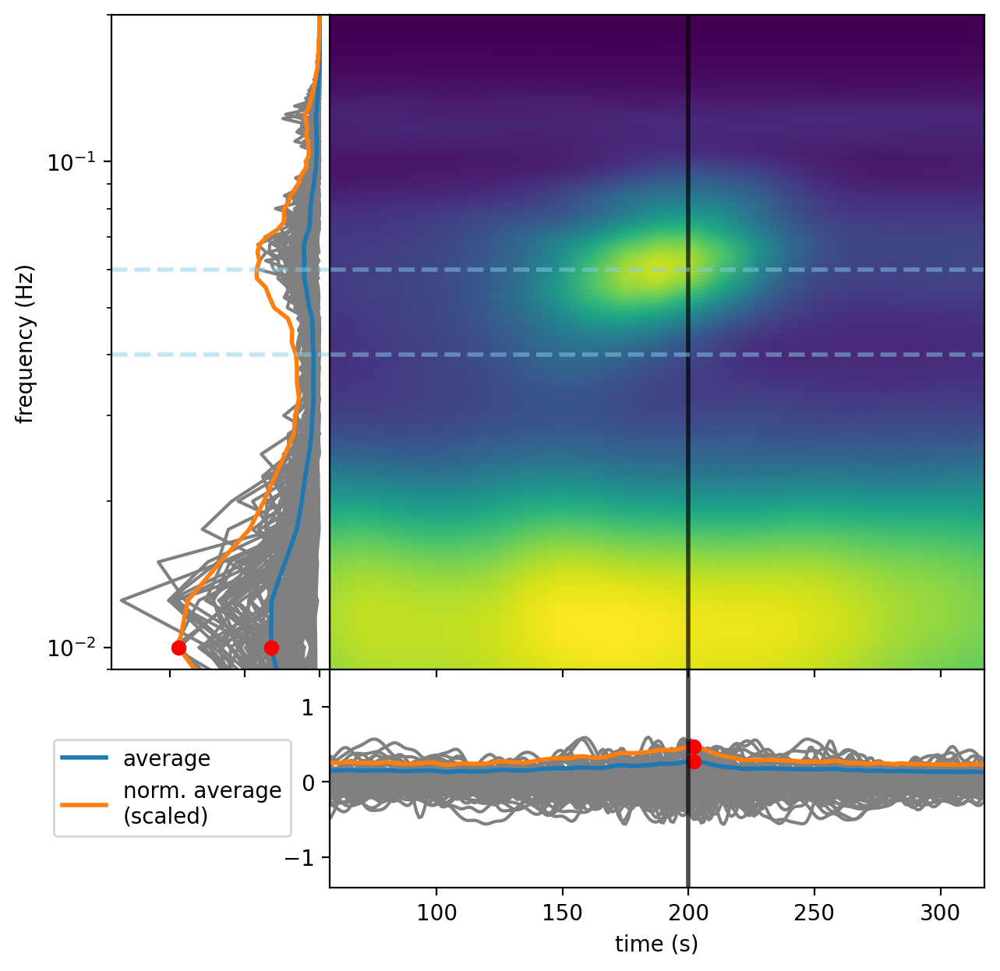

In [25]:
tete = plot_fancy_norm_nontracey(quality_MEL_100_R)

In [26]:
def qualc(stream, minval, maxval, plot=False):
    quality_stream = Stream()
    quality_stream.clear()

    for trace in stream:
        if max(abs(trace.data)) > minval and max(abs(trace.data)) < maxval:
            # if np.argmax(abs(trace.data)) > 140 and np.argmax(abs(trace.data)) < 260: # works well for 25 may need to adjust back for 100
                if plot==True:
                    plt.plot(trace.times(), trace.data)
                quality_stream.append(trace)
    
    return quality_stream

# quality_PIG_25_R = qualc(PIG_25_R, 1e-10, 6e-7, plot=False)
# quality_PIG_25_T = qualc(PIG_25_T, 1e-10, 6e-7, plot=False)
# quality_PIG_100_Z = qualc(PIG_100_Z, 1e-10, 8e-7, plot=False)
# quality_PIG_100_R = qualc(PIG_100_R, 1e-10, 8e-7, plot=False)
# quality_PIG_100_T = qualc(PIG_100_T, 1e-10, 9e-7, plot=False)
# quality_MEL_25_Z = qualc(MEL_25_Z, 1e-10, 4.3e-7, plot=False)
# quality_MEL_25_R = qualc(MEL_25_R, 1e-10, 2.5e-7, plot=False)
# quality_MEL_25_T = qualc(MEL_25_T, 1e-10, 6.7e-7, plot=False)
# quality_MEL_100_Z = qualc(MEL_100_Z, 1e-10, 3e-6, plot=False)
# quality_MEL_100_R = qualc(MEL_100_R, 1e-10, 6e-7, plot=False)
# quality_MEL_100_T = qualc(MEL_100_T, 1e-10, 5.2e-7, plot=False)
# quality_TON_25_Z = qualc(TON_25_Z, 1e-10, 8e-7, plot=False)
# quality_TON_25_R = qualc(TON_25_R, 1e-10, 9e-7, plot=False)
# quality_TON_25_T = qualc(TON_25_T, 1e-10, 1.6e-6, plot=False)
# quality_TON_100_Z = qualc(TON_100_Z, 1e-10, 9.4e-7, plot=False)
# quality_TON_100_R = qualc(TON_100_R, 1e-8, 6.3e-7, plot=False)


quality_PIG_100_Z = qualc(signals_PIG_aqual_10_100.select(component='Z'), 1e-10, 8e-7, plot=False)
quality_PIG_100_R = qualc(signals_PIG_aqual_10_100.select(component='R'), 1e-10, 8e-7, plot=False)
quality_PIG_100_T = qualc(signals_PIG_aqual_10_100.select(component='T'), 1e-10, 9e-7, plot=False)
quality_MEL_100_Z = qualc(MEL_10_100.select(component='Z'), 1e-10, 3e-6, plot=False)
quality_MEL_100_R = qualc(MEL_10_100.select(component='R'), 1e-10, 6e-7, plot=False)
quality_MEL_100_T = qualc(MEL_10_100.select(component='T'), 1e-10, 5.2e-7, plot=False)
quality_TON_100_Z = qualc(TON_10_100.select(component='Z'), 1e-10, 9.4e-7, plot=False)
quality_TON_100_R = qualc(TON_10_100.select(component='R'), 1e-8, 6.3e-7, plot=False)
quality_TON_100_T = qualc(TON_10_100.select(component='T'), 1e-10, 1.5e-6, plot=False)
quality_PIG_all_100_Z = qualc(PIG_all_10_100.select(component='Z'), 5e-9, 8e-7, plot=False)
quality_PIG_all_100_R = qualc(PIG_all_10_100.select(component='R'), 5e-9, 1e-6, plot=False)
quality_PIG_all_100_T = qualc(PIG_all_10_100.select(component='T'), 5e-9, 1e-6, plot=False)

C:\Users\thele\AppData\Local\Temp\ipykernel_27152\2556315634.py:66: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.96])


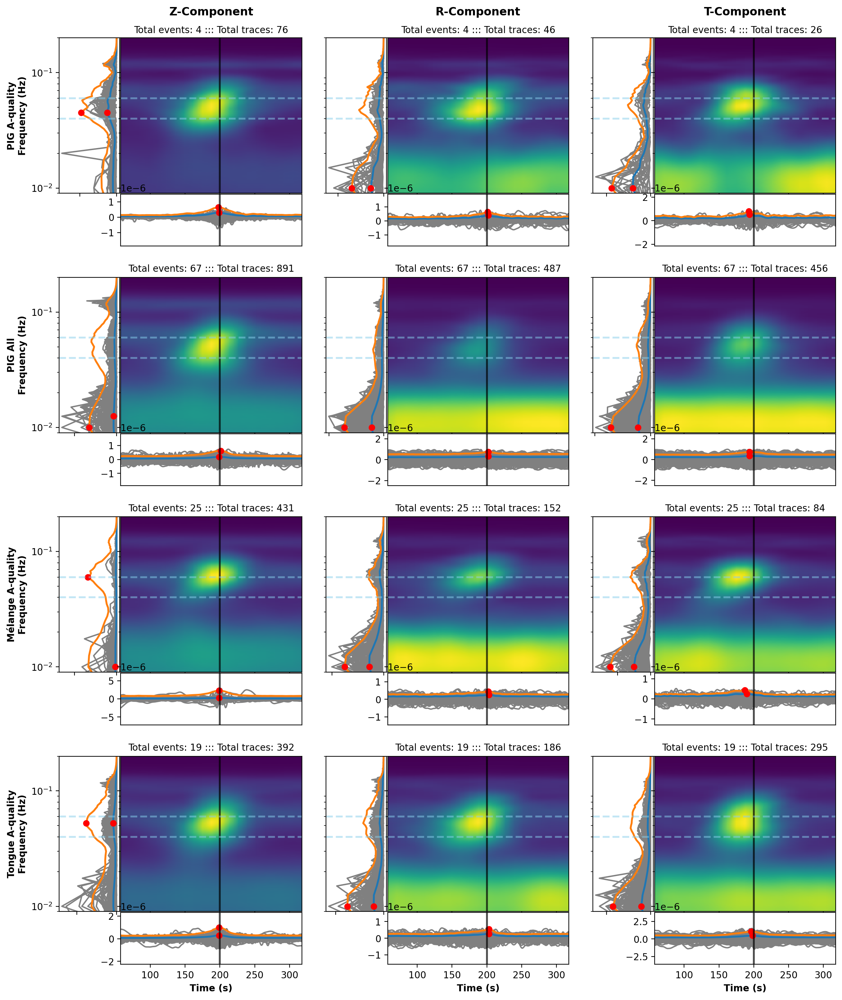

In [27]:
# streams to plot
# data_streams = [quality_PIG_100_Z, quality_PIG_all_100_Z, quality_MEL_100_Z, quality_TON_100_Z,
#                 quality_PIG_100_R, quality_PIG_all_100_R, quality_MEL_100_R, quality_TON_100_R,
#                 quality_PIG_100_T, quality_PIG_all_100_T, quality_MEL_100_T, quality_TON_100_T]

data_streams = [quality_PIG_100_Z, quality_PIG_100_R, quality_PIG_100_T, 
                quality_PIG_all_100_Z, quality_PIG_all_100_R, quality_PIG_all_100_T,
                quality_MEL_100_Z, quality_MEL_100_R, quality_MEL_100_T,
                quality_TON_100_Z, quality_TON_100_R, quality_TON_100_T]

fig = plt.figure(figsize=(15, 18))
outer_gs = fig.add_gridspec(nrows=4, ncols=3, hspace=0.15, wspace=0.1)

n_eventz = [len(PIG_events['lats']), len(PIG_events['lats']), len(PIG_events['lats']),
            len(MEL_events_Aqual['lats']), len(MEL_events_Aqual['lats']), len(MEL_events_Aqual['lats']),
            len(TON_events_Aqual['lats']), len(TON_events_Aqual['lats']), len(TON_events_Aqual['lats'])]

n_traces = [len(quality_PIG_all_100_Z), len(quality_PIG_all_100_R), len(quality_PIG_all_100_T), 
            len(quality_MEL_100_Z), len(quality_MEL_100_R), len(quality_MEL_100_T),
            len(quality_TON_100_Z), len(quality_TON_100_R), len(quality_TON_100_T)]

for idx, stream in enumerate(data_streams):
    row, col = divmod(idx, 3)
    cell = gridspec.GridSpecFromSubplotSpec(2, 2, outer_gs[row, col], height_ratios=[0.6,0.2], width_ratios=[0.2,0.6], hspace=0.01, wspace=0.01)
    ax_fft = fig.add_subplot(cell[0,0])
    ax_spec = fig.add_subplot(cell[0,1])
    ax_sig = fig.add_subplot(cell[1,1])

    if idx == 0:
        ax_spec.set_title('Z-Component', y=1.11, fontweight='bold')
        ax_spec.text(0.5, 1.05, 'Total events: {} ::: Total traces: {}'.format(len(PIG_events_Aqual['lats']), len(quality_PIG_100_Z)), ha='center', va='center', transform=ax_spec.transAxes, fontsize=10)
        ax_fft.set_ylabel('PIG A-quality\nFrequency (Hz)')
    elif idx == 1:
        ax_spec.set_title('R-Component', y=1.11, fontweight='bold')
        ax_spec.text(0.5, 1.05, 'Total events: {} ::: Total traces: {}'.format(len(PIG_events_Aqual['lats']), len(quality_PIG_100_R)), ha='center', va='center', transform=ax_spec.transAxes, fontsize=10)
    elif idx == 2:
        ax_spec.set_title('T-Component', y=1.11, fontweight='bold')
        ax_spec.text(0.5, 1.05, 'Total events: {} ::: Total traces: {}'.format(len(PIG_events_Aqual['lats']), len(quality_PIG_100_T)), ha='center', va='center', transform=ax_spec.transAxes, fontsize=10)
    else:
        ax_spec.set_title('Total events: {} ::: Total traces: {}'.format(n_eventz[idx-3], n_traces[idx-3]), fontsize=10)

    from matplotlib.ticker import NullFormatter
    if col == 0:
        if idx == 0:
            ax_fft.set_ylabel('PIG A-quality\nFrequency (Hz)', weight='bold')
        elif idx == 3:
            ax_fft.set_ylabel('PIG All\nFrequency (Hz)', weight='bold')
        elif idx == 6:
            ax_fft.set_ylabel('Mélange A-quality\nFrequency (Hz)', weight='bold')
        elif idx == 9:
            ax_fft.set_ylabel('Tongue A-quality\nFrequency (Hz)', weight='bold')
        ax_fft.tick_params(left=True, labelleft=True)
    else:
        ax_fft.tick_params(left=False, labelleft=False)
        ax_fft.yaxis.set_major_formatter(NullFormatter())

    if row == 3:
        ax_sig.set_xlabel('Time (s)', weight='bold')
        ax_sig.tick_params(bottom=True, labelbottom=True)
    else:
        ax_sig.tick_params(bottom=False, labelbottom=False)
        ax_sig.xaxis.set_major_formatter(NullFormatter())
    
    plot_fancy_norm_nontracey(stream, axes_dict={'fft': ax_fft, 'spectrogram': ax_spec, 'signal': ax_sig}, axlabel=False, xaxislabel=False)

plt.tight_layout(rect=[0, 0, 1, 0.96])

fig.savefig('bulk_spectrograms.png', bbox_inches='tight')

plt.show()


In [28]:
quality_PIG_100_Z

76 Trace(s) in Stream:

XH.RS14..LHZ | 2016-01-03T05:00:03.000000Z - 2016-01-03T05:06:42.000000Z | 1.0 Hz, 400 samples
...
(74 other traces)
...
YT.WHIT..LHZ | 2018-06-30T20:58:24.000000Z - 2018-06-30T21:05:03.000000Z | 1.0 Hz, 400 samples

[Use "print(Stream.__str__(extended=True))" to print all Traces]

In [29]:
PIG_events_Aqual

{'lats': [-75.45, -75.46, -75.45, -75.41],
 'lons': [-102.35, -102.18, -101.98, -99.76],
 'mags': [2.69, 2.32, 2.61, 2.48],
 'times': ['2016-01-03T04:57:45.000000Z',
  '2016-01-10T19:23:27.000000Z',
  '2016-01-17T02:01:56.000000Z',
  '2018-06-30T20:57:07.000000Z'],
 'quals': ['A', 'A', 'A', 'A']}

In [ ]:
event_times = [UTCDateTime(t) for t in PIG_events_Aqual['times']]

# one Stream per event
per_event_streams_z = {i: Stream() for i in range(len(event_times))}
unmatched = Stream()  # traces that don't overlap any event time

for tr in quality_PIG_100_Z:
    tr_start = tr.stats.starttime - 60*60
    tr_end = tr.stats.endtime + 60*60
    # events whose event_time falls inside this trace time window
    matches = [i for i, et in enumerate(event_times) if (tr_start <= et <= tr_end)]
    if matches:
        for i in matches:
            per_event_streams_z[i].append(tr.copy())
    else:
        unmatched.append(tr.copy())

# optional: list in same order as events
per_event_streams_list_z = [per_event_streams_z[i] for i in range(len(event_times))]

# short summary
n_with_traces = sum(1 for s in per_event_streams_list_z if len(s) > 0)
print(f"{n_with_traces}/{len(per_event_streams_list_z)} events have ≥1 trace; unmatched traces: {len(unmatched)}")

# print counts only for events that have traces
for i, st in enumerate(per_event_streams_list_z):
    if len(st) > 0:
        print(f" event {i}: {len(st)} traces (event time {event_times[i]})")
        
# one Stream per event
per_event_streams_r = {i: Stream() for i in range(len(event_times))}

for tr in quality_PIG_100_R:
    tr_start = tr.stats.starttime - 60*60
    tr_end = tr.stats.endtime + 60*60
    # events whose event_time falls inside this trace time window
    matches = [i for i, et in enumerate(event_times) if (tr_start <= et <= tr_end)]
    if matches:
        for i in matches:
            per_event_streams_r[i].append(tr.copy())
    else:
        unmatched.append(tr.copy())

per_event_streams_list_r = [per_event_streams_r[i] for i in range(len(event_times))]

n_with_traces = sum(1 for s in per_event_streams_list_r if len(s) > 0)
print(f"{n_with_traces}/{len(per_event_streams_list_r)} events have ≥1 trace; unmatched traces: {len(unmatched)}")

for i, st in enumerate(per_event_streams_list_r):
    if len(st) > 0:
        print(f" event {i}: {len(st)} traces (event time {event_times[i]})")
        
# one Stream per event
per_event_streams_t = {i: Stream() for i in range(len(event_times))}

for tr in quality_PIG_100_T:
    tr_start = tr.stats.starttime - 60*60
    tr_end = tr.stats.endtime + 60*60
    # events whose event_time falls inside this trace time window
    matches = [i for i, et in enumerate(event_times) if (tr_start <= et <= tr_end)]
    if matches:
        for i in matches:
            per_event_streams_t[i].append(tr.copy())
    else:
        unmatched.append(tr.copy())

per_event_streams_list_t = [per_event_streams_t[i] for i in range(len(event_times))]

n_with_traces = sum(1 for s in per_event_streams_list_t if len(s) > 0)
print(f"{n_with_traces}/{len(per_event_streams_list_t)} events have ≥1 trace; unmatched traces: {len(unmatched)}")

# print counts only for events that have traces
for i, st in enumerate(per_event_streams_list_t):
    if len(st) > 0:
        print(f" event {i}: {len(st)} traces (event time {event_times[i]})")

4/4 events have ≥1 trace; unmatched traces: 0
 event 0: 21 traces (event time 2016-01-03T04:57:45.000000Z)
 event 1: 23 traces (event time 2016-01-10T19:23:27.000000Z)
 event 2: 21 traces (event time 2016-01-17T02:01:56.000000Z)
 event 3: 11 traces (event time 2018-06-30T20:57:07.000000Z)
4/4 events have ≥1 trace; unmatched traces: 0
 event 0: 10 traces (event time 2016-01-03T04:57:45.000000Z)
 event 1: 15 traces (event time 2016-01-10T19:23:27.000000Z)
 event 2: 18 traces (event time 2016-01-17T02:01:56.000000Z)
 event 3: 3 traces (event time 2018-06-30T20:57:07.000000Z)
4/4 events have ≥1 trace; unmatched traces: 0
 event 0: 6 traces (event time 2016-01-03T04:57:45.000000Z)
 event 1: 9 traces (event time 2016-01-10T19:23:27.000000Z)
 event 2: 7 traces (event time 2016-01-17T02:01:56.000000Z)
 event 3: 4 traces (event time 2018-06-30T20:57:07.000000Z)


C:\Users\thele\AppData\Local\Temp\ipykernel_27152\116304211.py:58: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.96])


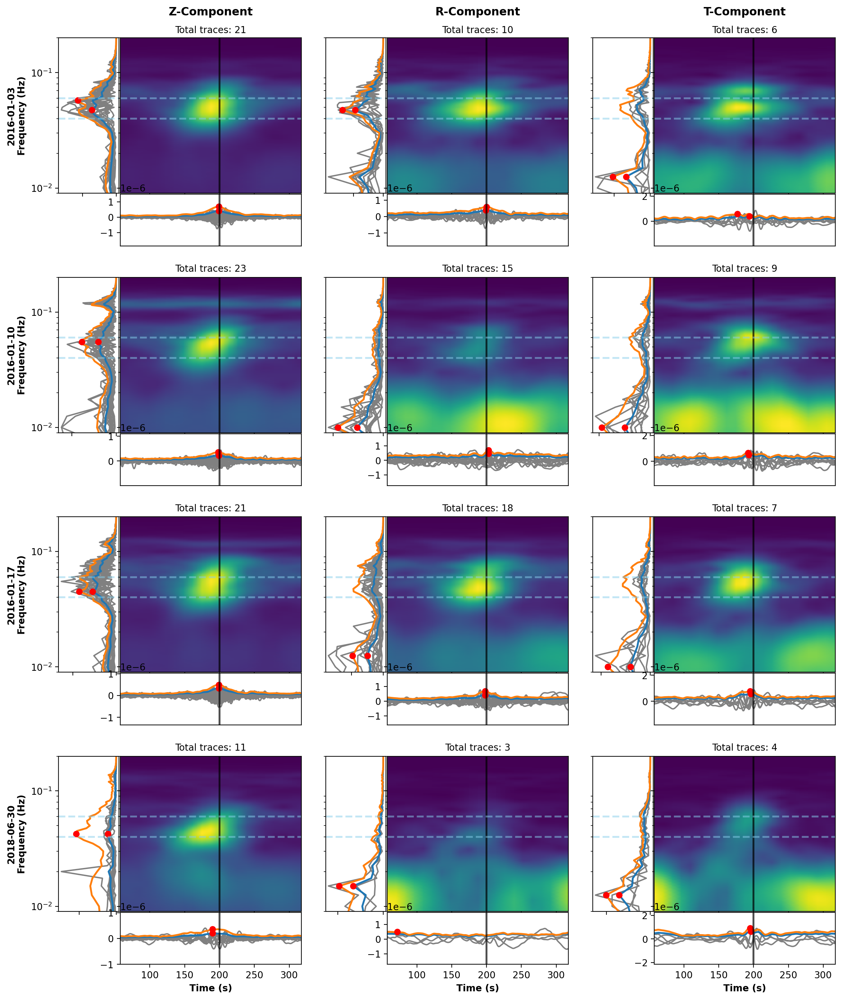

In [31]:
data_streams = [per_event_streams_z[0], per_event_streams_r[0], per_event_streams_t[0],
                per_event_streams_z[1], per_event_streams_r[1], per_event_streams_t[1], 
                per_event_streams_z[2], per_event_streams_r[2], per_event_streams_t[2],
                per_event_streams_z[3], per_event_streams_r[3], per_event_streams_t[3]]

fig = plt.figure(figsize=(15, 18))
outer_gs = fig.add_gridspec(nrows=4, ncols=3, hspace=0.15, wspace=0.1)

n_traces = [len(per_event_streams_z[1]), len(per_event_streams_r[1]), len(per_event_streams_t[1]), 
                len(per_event_streams_z[2]), len(per_event_streams_r[2]), len(per_event_streams_t[2]),
                len(per_event_streams_z[3]), len(per_event_streams_r[3]), len(per_event_streams_t[3])]

for idx, stream in enumerate(data_streams):
    row, col = divmod(idx, 3)
    cell = gridspec.GridSpecFromSubplotSpec(2, 2, outer_gs[row, col], height_ratios=[0.6,0.2], width_ratios=[0.2,0.6], hspace=0.01, wspace=0.01)
    ax_fft = fig.add_subplot(cell[0,0])
    ax_spec = fig.add_subplot(cell[0,1])
    ax_sig = fig.add_subplot(cell[1,1])

    if idx == 0:
        ax_spec.set_title('Z-Component', y=1.11, fontweight='bold')
        ax_spec.text(0.5, 1.05, 'Total traces: {}'.format(len(per_event_streams_z[0])), ha='center', va='center', transform=ax_spec.transAxes, fontsize=10)
        ax_fft.set_ylabel('PIG A-quality\nFrequency (Hz)')
    elif idx == 1:
        ax_spec.set_title('R-Component', y=1.11, fontweight='bold')
        ax_spec.text(0.5, 1.05, 'Total traces: {}'.format(len(per_event_streams_r[0])), ha='center', va='center', transform=ax_spec.transAxes, fontsize=10)
    elif idx == 2:
        ax_spec.set_title('T-Component', y=1.11, fontweight='bold')
        ax_spec.text(0.5, 1.05, 'Total traces: {}'.format(len(per_event_streams_t[0])), ha='center', va='center', transform=ax_spec.transAxes, fontsize=10)
    else:
        ax_spec.set_title('Total traces: {}'.format(n_traces[idx-3]), fontsize=10)

    from matplotlib.ticker import NullFormatter
    if col == 0:
        if idx == 0:
            ax_fft.set_ylabel('2016-01-03\nFrequency (Hz)', weight='bold')
        elif idx == 3:
            ax_fft.set_ylabel('2016-01-10\nFrequency (Hz)', weight='bold')
        elif idx == 6:
            ax_fft.set_ylabel('2016-01-17\nFrequency (Hz)', weight='bold')
        elif idx == 9:
            ax_fft.set_ylabel('2018-06-30\nFrequency (Hz)', weight='bold')
        ax_fft.tick_params(left=True, labelleft=True)
    else:
        ax_fft.tick_params(left=False, labelleft=False)
        ax_fft.yaxis.set_major_formatter(NullFormatter())

    if row == 3:
        ax_sig.set_xlabel('Time (s)', weight='bold')
        ax_sig.tick_params(bottom=True, labelbottom=True)
    else:
        ax_sig.tick_params(bottom=False, labelbottom=False)
        ax_sig.xaxis.set_major_formatter(NullFormatter())
    
    plot_fancy_norm_nontracey(stream, axes_dict={'fft': ax_fft, 'spectrogram': ax_spec, 'signal': ax_sig}, axlabel=False, xaxislabel=False)
    

plt.tight_layout(rect=[0, 0, 1, 0.96])

fig.savefig('event_Aqual_spectrograms.png', bbox_inches='tight')

plt.show()

In [32]:
per_event_streams_z[0]

21 Trace(s) in Stream:

XH.RS14..LHZ | 2016-01-03T05:00:03.000000Z - 2016-01-03T05:06:42.000000Z | 1.0 Hz, 400 samples
...
(19 other traces)
...
YT.WHIT..LHZ | 2016-01-03T04:58:59.000000Z - 2016-01-03T05:05:38.000000Z | 1.0 Hz, 400 samples

[Use "print(Stream.__str__(extended=True))" to print all Traces]

In [33]:
per_event_streams_z[0][0].stats

               network: XH
               station: RS14
              location: 
               channel: LHZ
             starttime: 2016-01-03T05:00:03.000000Z
               endtime: 2016-01-03T05:06:42.000000Z
         sampling_rate: 1.0
                 delta: 1.0
                  npts: 400
                 calib: 1.0
_fdsnws_dataselect_url: http://service.iris.edu/fdsnws/dataselect/1/query
               _format: MSEED
               arrival: 2016-01-03T05:03:22.626491Z
                   baz: 232.69184819602916
             distancey: 995.9981497237667
                   idx: 0
                 mseed: AttribDict({'dataquality': 'M', 'number_of_records': 1, 'encoding': 'STEIM2', 'byteorder': '>', 'record_length': 4096, 'filesize': 16384})
            processing: ['ObsPy 1.4.2: trim(endtime=UTCDateTime(2016, 1, 3, 5, 10, 3)::fill_value=None::nearest_sample=True::pad=False::starttime=UTCDateTime(2016, 1, 3, 4, 56, 43))', "ObsPy 1.4.2: remove_response(fig=None::inventory=<obspy.core

In [34]:
def plot_fancy_nontracey(trace, axes_dict=None, axlabel=True, xaxislabel=True):
    '''
    plot of spectrogram, signal, and FFT, with normalised and unnormalised averages in place
    '''
    ## spectrogram bit
    fs = 1.0  # sampling rate in Hz
    nfft = 128  # number of points in FFT
    pad_to = 1024  # padding to next power of 2
    noverlap = 115  # number of points to overlap between segments
    vmin, vmax = 0.0, 1.0  # color scale limits

    # extracting the data
    datas = []
    datas_times = []
    if len(trace) > 300:  # somewhat arbitrary - we expect 400 and can't use 128 or below lengths
        datas.append(trace)
        datas_times.append(trace.times())

    if len(datas) == 0:
        return None

    datas_max = max([max(data) for data in datas])
    datas_min = min([min(data) for data in datas])

    # Hilbert envelopes
    envelopes = []
    envelopes_max = []
    envelopes_norm = []
    for i in range(len(datas)):
        analytic_signal = hilbert(datas[i])
        envelope = np.abs(analytic_signal)
        envelopes_max.append(np.max(envelope))
        envelope_norm = envelope / np.max(envelope)  # normalising the envelope
        #envelopes.append(envelope)
        if np.any(np.isnan(envelope_norm)) == False and np.any(np.isinf(envelope_norm)) == False:
            envelopes.append(envelope)
            envelopes_norm.append(envelope_norm)

    # average signal
    average_signal = np.mean(envelopes, axis=0)
    average_signal_norm = np.mean(envelopes_norm, axis=0) * np.max(envelopes_max)

    # doing the spectrogram calculation
    specs, freqs, times = [], [], []
    for data in datas:
        spec, freq, time = mlab.specgram(data, Fs=fs, NFFT=nfft, pad_to=pad_to, noverlap=noverlap)
        spec = np.sqrt(spec[1:, :])
        freq = freq[1:]
        halfbin_time = (time[1] - time[0]) / 2.0
        halfbin_freq = (freq[1] - freq[0]) / 2.0
        freq = np.concatenate((freq, [freq[-1] + 2 * halfbin_freq]))
        time = np.concatenate((time, [time[-1] + 2 * halfbin_time]))
        time -= halfbin_time
        freq -= halfbin_freq
        
        if spec.min() != spec.max():
            specs.append(spec)
            freqs.append(freq)
            times.append(time)

    # making them all of equal size
    min_time_bins = min(spec.shape[1] for spec in specs)
    min_freq_bins = min(spec.shape[0] for spec in specs)
    for i in range(len(specs)):
        specs[i] = specs[i][:min_freq_bins, :min_time_bins]
        vmin = specs[i].min() + vmin * float(specs[i].max() - specs[i].min())
        vmax = specs[i].min() + vmax * float(specs[i].max() - specs[i].min())
        specs[i] = (specs[i] - specs[i].min()) / (specs[i].max() - specs[i].min())  # normalize

    avg_spec = np.mean(specs, axis=0)
    spectrogram_data = times[0][:min_time_bins], freqs[0][:min_freq_bins], avg_spec

    ## FFT bit
    spectrums = []
    ns = []
    fft_datas = []
    fft_datas_norm = []
    fft_max = []
    for i in range(len(datas)):
        fft = np.fft.fft(datas[i])
        fft_max.append(np.max(np.abs(fft)))
        fft_norm = fft / np.max(np.abs(fft))  # normalize
        nn = len(datas[i])
        if np.any(np.isnan(fft_norm)) == False and np.any(np.isinf(fft_norm)) == False:
            fft_datas.append(fft)
            fft_datas_norm.append(fft_norm)
            ns.append(nn)
            spectrums.append(np.fft.fftfreq(nn, 1))

    fft_average = np.mean(np.abs(fft_datas), axis=0)
    fft_average_norm = np.mean(np.abs(fft_datas_norm), axis=0) * np.max(fft_max)

    ## plotting - use provided axes or create new ones
    if axes_dict is None:
        # Create standalone figure
        fig = plt.figure(figsize=(7, 7))
        ax_sig = fig.add_axes([0.3, 0.1, 0.6, 0.2])
        ax_spec = fig.add_axes([0.3, 0.3, 0.6, 0.6])
        ax_fft = fig.add_axes([0.1, 0.3, 0.2, 0.6])
        standalone = True
    else:
        # Use provided axes from mosaic
        ax_sig = axes_dict['signal']
        ax_spec = axes_dict['spectrogram']
        ax_fft = axes_dict['fft']
        standalone = False

    # plot signals
    for i in range(len(datas)):
        ax_sig.plot(datas_times[i], datas[i], color='grey')
    ax_sig.plot(datas_times[0], average_signal, color='C0', linewidth=2, label='avg signal')
    ax_sig.plot(datas_times[0], average_signal_norm, color='C1', linewidth=2, label='avg norm signal')
    ax_sig.plot(datas_times[0][np.argmax(average_signal)], np.max(average_signal), 'or')
    ax_sig.plot(datas_times[0][np.argmax(average_signal_norm)], np.max(average_signal_norm), 'or')
    ax_sig.axvline(200, 0, 1, color='k', linewidth=2, alpha=0.7)
    if xaxislabel is True:
        ax_sig.set_xlabel('time (s)')

    # plot spectrogram
    x, y, data = spectrogram_data
    ax_spec.set_yscale('log')
    img_spec = ax_spec.pcolormesh(x, y, data, shading='gouraud')
    img_spec.set_rasterized(True)
    ax_spec.axvline(200, 0, 1, color='k', alpha=0.7, linewidth=2, label='expected arrival')
    ax_spec.axhline(0.04, 0, 1, color='skyblue', alpha=0.5, ls='--', linewidth=2, label='expected freq.')
    ax_spec.axhline(0.06, 0, 1, color='skyblue', alpha=0.5, ls='--', linewidth=2)

    # plot fft
    for i in range(len(spectrums)):
        ax_fft.semilogy(np.abs(fft_datas[i][:ns[i] // 2]), spectrums[i][:ns[i] // 2], color='grey')
    ax_fft.semilogy(np.abs(fft_average[:ns[0] // 2]), spectrums[0][:ns[0] // 2], color='C0', linewidth=2, label='average')
    ax_fft.semilogy(np.abs(fft_average_norm[:ns[0] // 2]), spectrums[0][:ns[0] // 2], color='C1', linewidth=2, label='norm. average\n(scaled)')
    ax_fft.plot(np.max(fft_average), spectrums[0][np.argmax(fft_average[:ns[0] // 2])], 'or')
    ax_fft.plot(np.max(fft_average_norm), spectrums[0][np.argmax(fft_average_norm[:ns[0] // 2])], 'or')
    ax_fft.axhline(0.04, 0, 1, color='skyblue', alpha=0.5, ls='--', linewidth=2)
    ax_fft.axhline(0.06, 0, 1, color='skyblue', alpha=0.5, ls='--', linewidth=2)
    if axlabel is True:
        ax_fft.set_ylabel('frequency (Hz)')
        leg = ax_fft.legend(bbox_to_anchor=(0.85, -0.1, 0.02, 0.01))

    ax_fft.invert_xaxis()

    # Set limits
    ax_spec.set_ylim(0.009, 0.2)
    ax_spec.set_xlim(x[0], x[-1])
    ax_sig.set_ylim(datas_min * 2.5, datas_max * 2.5)
    ax_sig.set_xlim(x[0], x[-1])
    ax_fft.set_ylim(0.009, 0.2)
    
    from matplotlib.ticker import NullFormatter
    ax_spec.xaxis.set_major_formatter(NullFormatter())
    ax_spec.yaxis.set_major_formatter(NullFormatter())
    ax_fft.xaxis.set_major_formatter(NullFormatter())
    
    # Only format axes if standalone
    if standalone:
        
        plt.show()

    return ax_sig, ax_spec, ax_fft

In [35]:
# per_event_streams_z = {i: Stream() for i in range(len(event_times))}
distance_sep_streams_z = {i: Stream() for i in range(10)}
az_sep_streams_z = {i: Stream() for i in range(12)}

for i in range(len(per_event_streams_z[0])):
    if per_event_streams_z[0][i].stats.distancey < 100:
        distance_sep_streams_z[0].append(per_event_streams_z[0][i])
    elif per_event_streams_z[0][i].stats.distancey < 200:
        distance_sep_streams_z[1].append(per_event_streams_z[0][i])
    elif per_event_streams_z[0][i].stats.distancey < 300:
        distance_sep_streams_z[2].append(per_event_streams_z[0][i])
    elif per_event_streams_z[0][i].stats.distancey < 400:
        distance_sep_streams_z[3].append(per_event_streams_z[0][i])
    elif per_event_streams_z[0][i].stats.distancey < 500:
        distance_sep_streams_z[4].append(per_event_streams_z[0][i])
    elif per_event_streams_z[0][i].stats.distancey < 600:
        distance_sep_streams_z[5].append(per_event_streams_z[0][i])
    elif per_event_streams_z[0][i].stats.distancey < 700:
        distance_sep_streams_z[6].append(per_event_streams_z[0][i])
    elif per_event_streams_z[0][i].stats.distancey < 800:
        distance_sep_streams_z[7].append(per_event_streams_z[0][i])
    elif per_event_streams_z[0][i].stats.distancey < 900:
        distance_sep_streams_z[8].append(per_event_streams_z[0][i])
    else:
        distance_sep_streams_z[9].append(per_event_streams_z[0][i])
        
    if per_event_streams_z[0][i].stats.baz < 30:
        az_sep_streams_z[0].append(per_event_streams_z[0][i])
    elif per_event_streams_z[0][i].stats.baz < 60:
        az_sep_streams_z[1].append(per_event_streams_z[0][i])
    elif per_event_streams_z[0][i].stats.baz < 90:
        az_sep_streams_z[2].append(per_event_streams_z[0][i])
    elif per_event_streams_z[0][i].stats.baz < 120:
        az_sep_streams_z[3].append(per_event_streams_z[0][i])
    elif per_event_streams_z[0][i].stats.baz < 150:
        az_sep_streams_z[4].append(per_event_streams_z[0][i])
    elif per_event_streams_z[0][i].stats.baz < 180:
        az_sep_streams_z[5].append(per_event_streams_z[0][i])
    elif per_event_streams_z[0][i].stats.baz < 210: 
        az_sep_streams_z[6].append(per_event_streams_z[0][i])
    elif per_event_streams_z[0][i].stats.baz < 240:
        az_sep_streams_z[7].append(per_event_streams_z[0][i])
    elif per_event_streams_z[0][i].stats.baz < 270:
        az_sep_streams_z[8].append(per_event_streams_z[0][i])
    elif per_event_streams_z[0][i].stats.baz < 300:
        az_sep_streams_z[9].append(per_event_streams_z[0][i])
    elif per_event_streams_z[0][i].stats.baz < 330:
        az_sep_streams_z[10].append(per_event_streams_z[0][i])
    else:
        az_sep_streams_z[11].append(per_event_streams_z[0][i])
    
for i in range(12):
    print(f" distance bin {i}: {len(az_sep_streams_z[i])} traces")
# print(distance_sep_streams_z)
# print(az_sep_streams_z)
    # print(f"Trace {i}: distance to event = {per_event_streams_z[0][i].stats.distancey:.2f} km, azimuth = {per_event_streams_z[0][i].stats.baz:.1f}°")
    # plote = plot_fancy_nontracey(per_event_streams_z[0][i])
    
# for i in range(10):
#     if len(distance_sep_streams_z[i]) > 0:
#         if len(distance_sep_streams_z[i]) == 1:
#             plote = plot_fancy_nontracey(distance_sep_streams_z[i][0])
#         else:
#             plote = plot_fancy_norm_nontracey(distance_sep_streams_z[i])

 distance bin 0: 1 traces
 distance bin 1: 0 traces
 distance bin 2: 0 traces
 distance bin 3: 1 traces
 distance bin 4: 4 traces
 distance bin 5: 5 traces
 distance bin 6: 4 traces
 distance bin 7: 3 traces
 distance bin 8: 2 traces
 distance bin 9: 1 traces
 distance bin 10: 0 traces
 distance bin 11: 0 traces


C:\Users\thele\AppData\Local\Temp\ipykernel_27152\368047816.py:20: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.96])


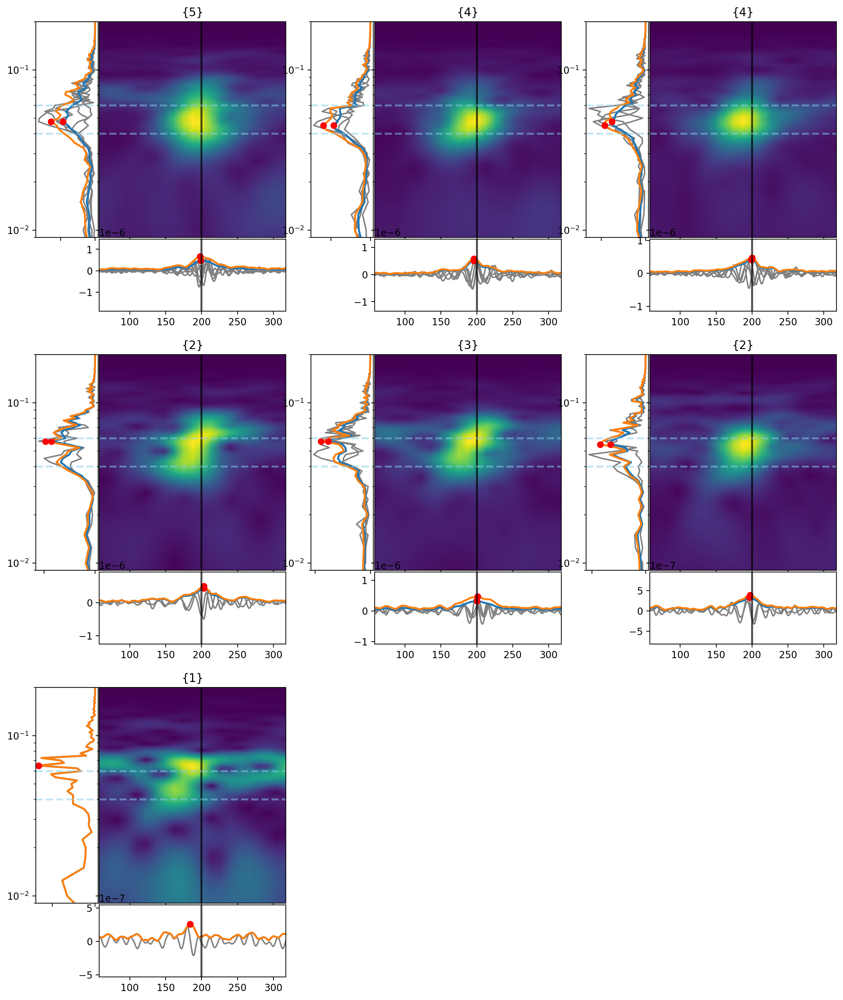

In [36]:
fig = plt.figure(figsize=(15, 18))
outer_gs = fig.add_gridspec(nrows=3, ncols=3, hspace=0.15, wspace=0.1)

counter = 0

for idx, stream in enumerate(distance_sep_streams_z.values()):
    if len(stream) == 0:
        continue

    row, col = divmod(counter, 3)
    cell = gridspec.GridSpecFromSubplotSpec(2, 2, outer_gs[row, col], height_ratios=[0.6,0.2], width_ratios=[0.2,0.6], hspace=0.01, wspace=0.01)
    ax_fft = fig.add_subplot(cell[0,0])
    ax_spec = fig.add_subplot(cell[0,1])
    ax_sig = fig.add_subplot(cell[1,1])
    
    plot_fancy_norm_nontracey(stream, axes_dict={'fft': ax_fft, 'spectrogram': ax_spec, 'signal': ax_sig}, axlabel=False, xaxislabel=False)
    ax_spec.set_title({len(stream)})
    counter += 1

plt.tight_layout(rect=[0, 0, 1, 0.96])

# fig.savefig('event_Aqual_spectrograms.svg', bbox_inches='tight')

plt.show()

C:\Users\thele\AppData\Local\Temp\ipykernel_27152\1354317593.py:18: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.96])


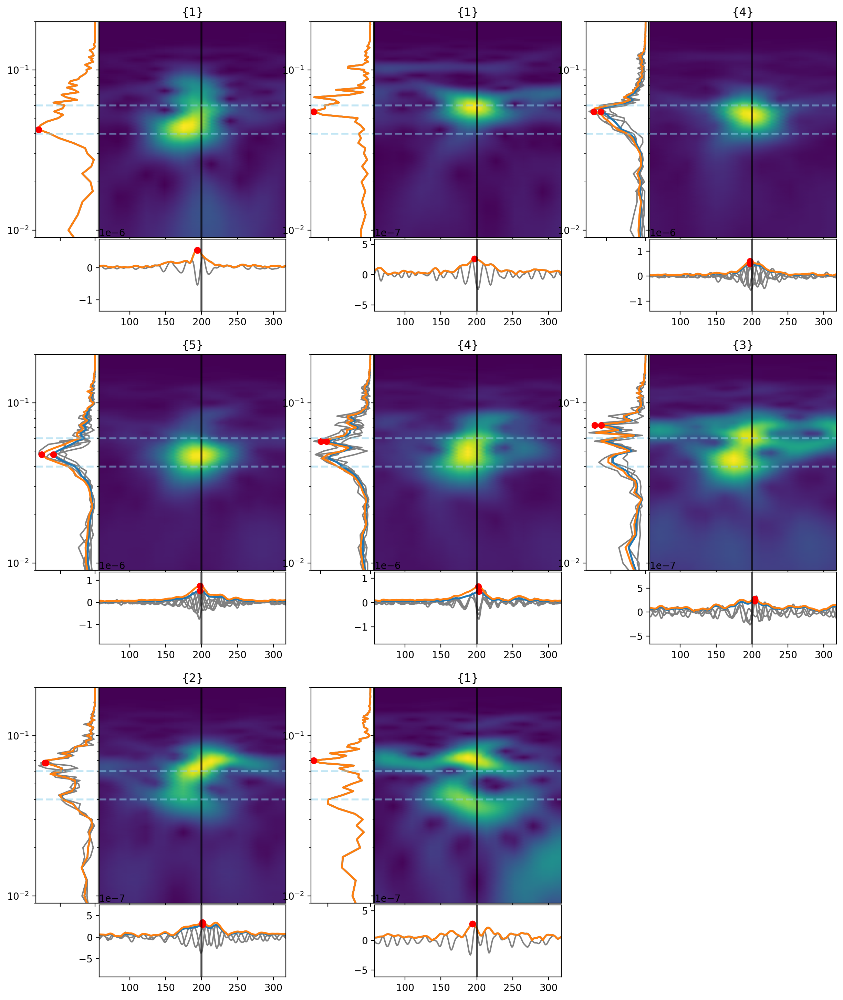

In [37]:
fig = plt.figure(figsize=(15, 18))
outer_gs = fig.add_gridspec(nrows=3, ncols=3, hspace=0.15, wspace=0.1)

counter = 0
for idx, stream in enumerate(az_sep_streams_z.values()):
    if len(stream) == 0:
        continue
    row, col = divmod(counter, 3)
    cell = gridspec.GridSpecFromSubplotSpec(2, 2, outer_gs[row, col], height_ratios=[0.6,0.2], width_ratios=[0.2,0.6], hspace=0.01, wspace=0.01)
    ax_fft = fig.add_subplot(cell[0,0])
    ax_spec = fig.add_subplot(cell[0,1])
    ax_sig = fig.add_subplot(cell[1,1])
    
    plot_fancy_norm_nontracey(stream, axes_dict={'fft': ax_fft, 'spectrogram': ax_spec, 'signal': ax_sig}, axlabel=False, xaxislabel=False)
    ax_spec.set_title({len(stream)})
    counter += 1

plt.tight_layout(rect=[0, 0, 1, 0.96])

# fig.savefig('event_Aqual_spectrograms.svg', bbox_inches='tight')

plt.show()

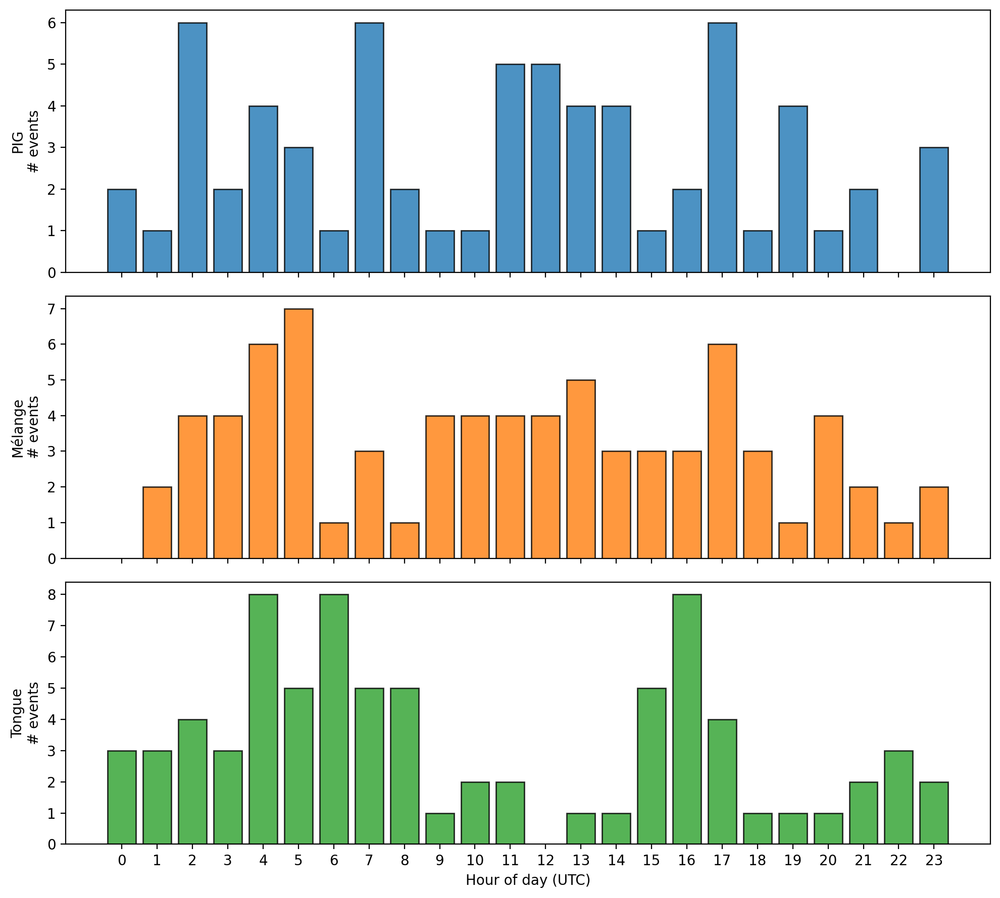

In [ ]:
def hourly_counts_from_times(times_list):
    ts = pd.to_datetime(times_list, utc=True, errors='coerce')
    valid = ts[~pd.isna(ts)]
    if len(valid) == 0:
        return np.zeros(24, dtype=int)
    hours = valid.hour.to_numpy(dtype=int)
    return np.bincount(hours, minlength=24)

counts_PIG = hourly_counts_from_times(PIG_events['times'])
counts_MEL = hourly_counts_from_times(MEL_events['times'])
counts_TON = hourly_counts_from_times(TON_events['times'])

hours_idx = np.arange(24)

fig, axes = plt.subplots(3, 1, figsize=(10, 9), sharex=True)
axes[0].bar(hours_idx, counts_PIG, color='C0', edgecolor='k', alpha=0.8)
axes[0].set_ylabel('PIG\n# events')
# axes[0].set_title('Hourly distribution (UTC)')

axes[1].bar(hours_idx, counts_MEL, color='C1', edgecolor='k', alpha=0.8)
axes[1].set_ylabel('Mélange\n# events')

axes[2].bar(hours_idx, counts_TON, color='C2', edgecolor='k', alpha=0.8)
axes[2].set_ylabel('Tongue\n# events')
axes[2].set_xlabel('Hour of day (UTC)')
axes[2].set_xticks(hours_idx)

plt.tight_layout()
fig.savefig('PIG_MEL_TON_hourly_histograms.png', dpi=150)
plt.show()